# Hierarchical exponential growth model

In [1]:
import string

import arviz as az
import chi
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import pints
import seaborn as sns
sns.set_theme()

The data-generating model is a hierarchical exponential growth model governed
by

$$
    p(y, \psi | \theta , t) = p(y | \psi , t)\, p(\psi | \theta),
$$

where $\psi = (y_0, \lambda, \sigma)$ and
$\theta = (\mu_{y_0}, \mu_{\lambda}, \sigma_{y_0}, \sigma_{\lambda}, \theta_{\sigma})$.
The measurements of individuals are governed by a distirbution defined by the
mechanistic model-error model pair

$$
    p(y | \psi , t) = \mathcal{N}(y | y_0\mathrm{e}^{\lambda t}, \sigma ^2),
$$

and the inter-individual variability is governed by the population model

$$
    p(\psi | \theta) =
        \mathcal{N}(y_0 | \mu_{y_0}, \sigma ^2_{y_0})\,
        \mathcal{N}(\lambda | \mu_{\lambda}, \sigma ^2_{\lambda})\,
        \delta (\sigma - \theta_{\sigma}).
$$

## Define data-generating model

In [2]:
class ToyExponentialGrowthModel(chi.MechanisticModel):
    """
    A toy exponential growth model.
    """
    def __init__(self):
        super(ToyExponentialGrowthModel, self).__init__()

        self._has_sensitivities = False

    def enable_sensitivities(self, enabled, parameter_names=None):
        r"""
        Enables the computation of the model output sensitivities to the model
        parameters if set to ``True``.

        The sensitivities of the model outputs are defined as the partial
        derviatives of the ouputs :math:`\bar{y}` with respect to the model
        parameters :math:`\psi`

        .. math:
            \frac{\del \bar{y}}{\del \psi}.

        :param enabled: A boolean flag which enables (``True``) / disables
            (``False``) the computation of sensitivities.
        :type enabled: bool
        """
        self._has_sensitivities = bool(enabled)

    def has_sensitivities(self):
        """
        Returns a boolean indicating whether sensitivities have been enabled.
        """
        return self._has_sensitivities

    def n_outputs(self):
        """
        Returns the number of output dimensions.

        By default this is the number of states.
        """
        return 1

    def n_parameters(self):
        """
        Returns the number of parameters in the model.

        Parameters of the model are initial state values and structural
        parameter values.
        """
        return 2

    def outputs(self):
        """
        Returns the output names of the model.
        """
        return ['Count']

    def parameters(self):
        """
        Returns the parameter names of the model.
        """
        return ['Initial count', 'Growth rate']

    def simulate(self, parameters, times):
        """
        Returns the numerical solution of the model outputs (and optionally
        the sensitivites) for the specified parameters and times.

        The model outputs are returned as a 2 dimensional NumPy array of shape
        ``(n_outputs, n_times)``. If sensitivities are enabled, a tuple is
        returned with the NumPy array of the model outputs and a NumPy array of
        the sensitivities of shape ``(n_times, n_outputs, n_parameters)``.

        :param parameters: An array-like object with values for the model
            parameters.
        :type parameters: list, numpy.ndarray
        :param times: An array-like object with time points at which the output
            values are returned.
        :type times: list, numpy.ndarray

        :rtype: np.ndarray of shape (n_outputs, n_times) or
            (n_times, n_outputs, n_parameters)
        """
        y0, growth_rate = parameters
        times = np.asarray(times)

        # Solve model
        y = y0 * np.exp(growth_rate * times)

        if not self._has_sensitivities:
            return y[np.newaxis, :]

        sensitivities = np.empty(shape=(len(times), 1, 2))
        sensitivities[:, 0, 0] = np.exp(growth_rate * times)
        sensitivities[:, 0, 1] = times * y

        return y[np.newaxis, :], sensitivities

# Data-generating parameters
population_parameters = [
    10,    # Mean initial condition
    2,     # Mean exponential growth
    1,     # Std. initial condition
    0.5,   # Std. exponential growth
    0.8]   # Sigma

## 0. Distributional shape of data-generating process over time

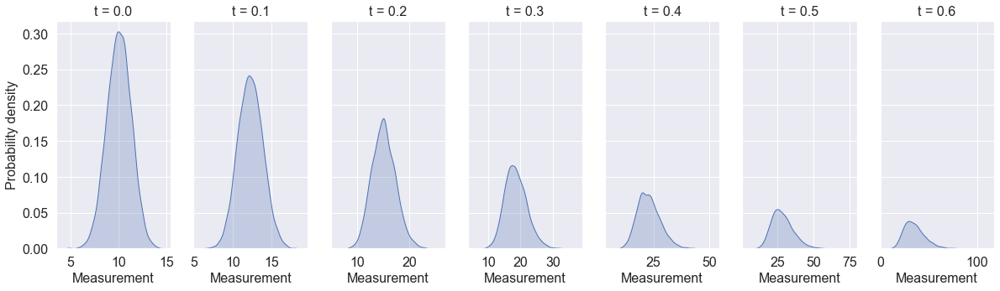

In [3]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Visualise distributions over time
fontsize = '16'
fig, axes = plt.subplots(
    1, len(times), figsize=(20, 5), sharey='row')
axes[0].set_ylabel('Probability density', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[tid].set_xlabel('Measurement', fontsize=fontsize)
    axes[tid].tick_params(labelsize=fontsize)

    # Plot KDE plot
    sns.kdeplot(
        x=measurements[0, tid], fill=True, linewidth=1, ax=axes[tid],
        legend=False)

plt.show()

## 1. 100 Individuals (non-snapshot data)

In [7]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 100
times = np.linspace(0, 0.6)
measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Swap axes for later convenience
measurements = np.moveaxis(
    measurements, source=(0, 1, 2), destination=(1, 2, 0))

fig = go.Figure()
for idx in range(n_ids):
    fig.add_trace(go.Scatter(
        x=times,
        y=measurements[idx, 0],
        mode='markers+lines',
        name='ID %d' % idx
    ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

### 1.1 Hierarchical inference

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     13     0.5      2        0:00.1
1     14     0.25     1        0:00.1
2     15     0.25     1        0:00.1
3     16     0.5      1        0:00.1


/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.7/site-packages/pints/_mcmc/_nuts.py:258: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.7/site-packages/pints/_mcmc/_nuts.py:157: RuntimeWarning:

overflow encountered in exp



20    109    0.781242 6        0:00.9
40    3097   0.768    143      0:25.2
60    6412   0.771    158      0:51.9
80    8952   0.762    121      1:12.0
100   11432  0.784    118      1:31.8
120   12838  0.69586  67       1:43.1
140   14322  0.791    71       1:54.9
160   15587  0.702    61       2:04.9
180   16783  0.734    57       2:14.4
200   17947  0.768    56       2:23.6
220   18919  0.758    47       2:31.3
240   20147  0.759    59       2:41.1
260   21271  0.718    54       2:50.1
280   22499  0.749    59       2:59.9
300   23695  0.765    57       3:09.5
320   24763  0.747    51       3:18.0
340   25991  0.760654 59       3:27.7
360   27091  0.764    53       3:36.4
380   28351  0.763    60       3:46.3
400   29355  0.742    48       3:54.3
420   30359  0.767    48       4:02.9
440   31427  0.758    51       4:11.9
460   32635  0.708    58       4:22.2
480   33959  0.775929 64       4:32.9
500   34995  0.766    50       4:41.2
520   36223  0.829    59       4:50.9
540   37483 

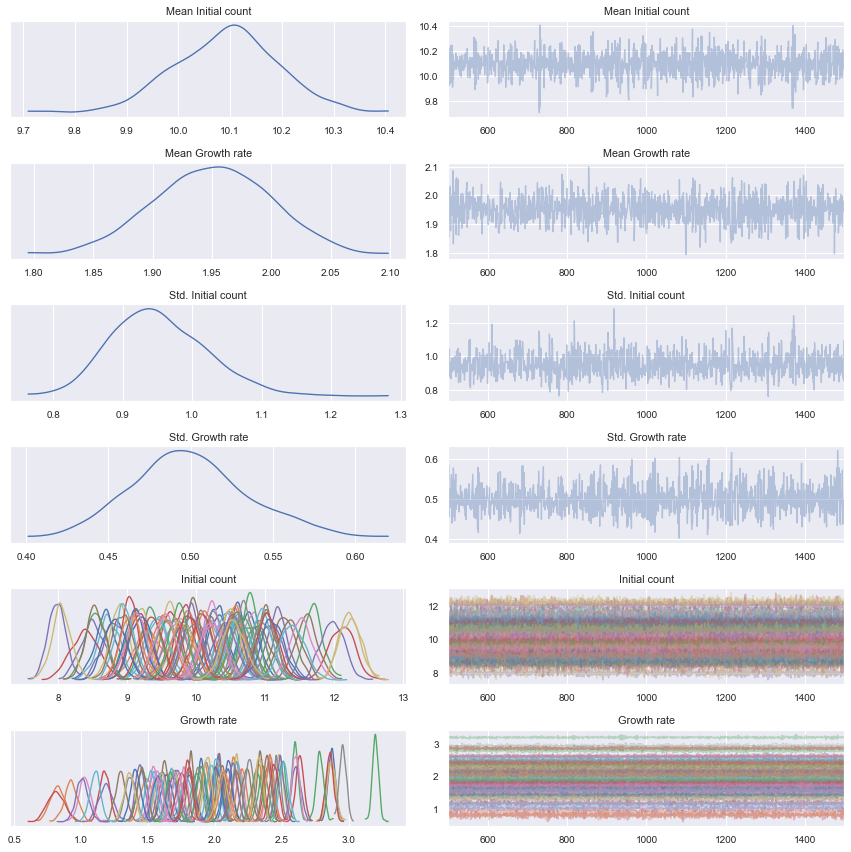

In [6]:
# Format data as dataframe
ids = np.arange(1, n_ids + 1)
n_times = len(times)
measurements_df = pd.DataFrame({
    'Observable': 'Count',
    'Value': measurements.flatten(),
    'ID': np.broadcast_to(ids[:, np.newaxis], (n_ids, n_times)).flatten(),
    'Time': np.broadcast_to(times[np.newaxis, :], (n_ids, n_times)).flatten()
})

# Define hierarchical log-posterior
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1))      # Std. exponential growth
problem = chi.ProblemModellingController(mechanistic_model, error_model)
problem.fix_parameters({'Sigma': population_parameters[-1]})
problem.set_population_model(population_model)
problem.set_data(measurements_df)
problem.set_log_prior(log_prior)
log_posterior = problem.get_log_posterior()

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_hierarchical = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_hierarchical.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

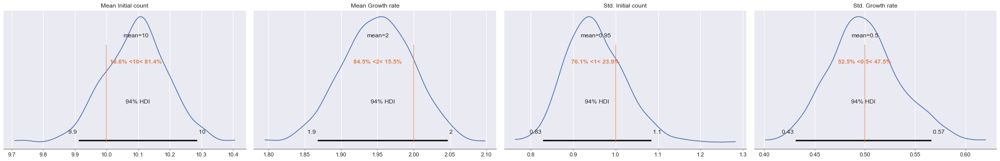

In [7]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples_hierarchical.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean Initial count',
        'Mean Growth rate',
        'Std. Initial count',
        'Std. Growth rate'],
    ref_val=population_parameters)
plt.tight_layout()

### 1.2. Population filter inference

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     259    0.490695 128      0:00.6
1     290    0.25     16       0:00.6
2     353    0.327    32       0:00.8
3     480    0.496    64       0:01.0
20    3443   0.75     165      0:07.4
40    7354   0.762    187      0:15.7
60    11053  0.744    177      0:23.7
80    14629  0.761    171      0:31.4
100   17055  0.745    116      0:37.0
120   18410  0.714    65       0:39.8
140   19360  0.73739  46       0:42.1
160   20448  0.728    52       0:44.9
180   21403  0.753    46       0:47.0
200   22427  0.764    49       0:49.4
220   23484  0.735    51       0:51.8
240   24317  0.752    40       0:53.6
260   24991  0.721    32       0:55.1
280   26443  0.77     70       0:58.9
300   27269  0.743    40       1:01.1
320   28126  0.752    41       1:03.1
340   29130  0.763    48       1:05.6
360   29787  0.748    32       1:07.1
380   30727  0.775    45       1:09.1
400   31398  0.76 

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.7/site-packages/arviz/plots/traceplot.py:210: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (56), generating only 20 plots



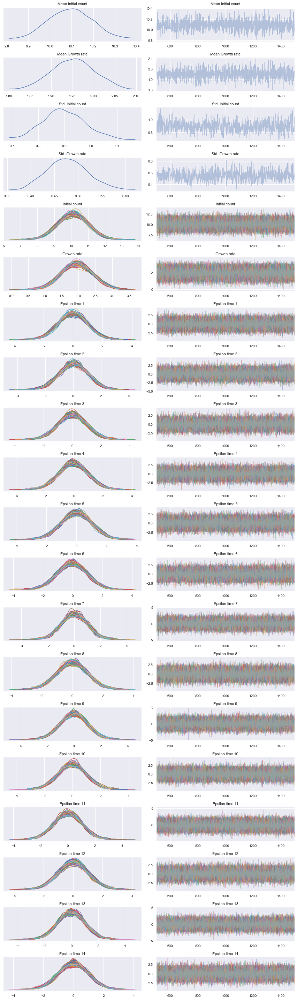

In [8]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
pop_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1))      # Std. exponential growth
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, pop_model, log_prior,
    sigma=population_parameters[-1])

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

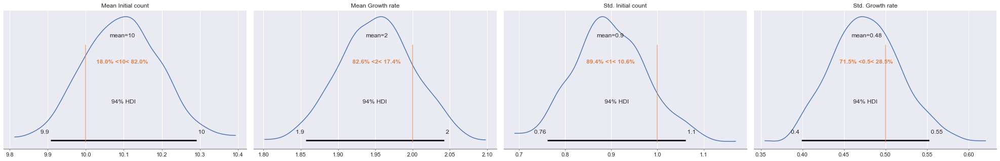

In [9]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean Initial count',
        'Mean Growth rate',
        'Std. Initial count',
        'Std. Growth rate'],
    ref_val=population_parameters[:-1])
plt.tight_layout()

### Results

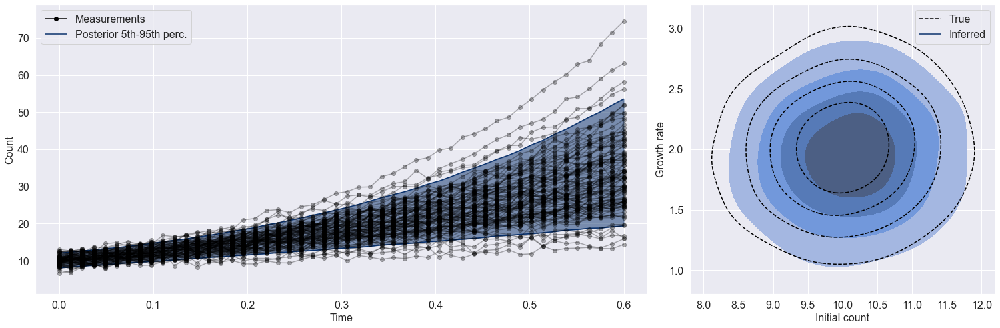

In [70]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(21, 7), gridspec_kw={'width_ratios': [2, 1]})

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 5000
parameters =  posterior_samples_filter.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 2))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])

# Plot population filter inference results (measurement space)
times = np.linspace(0, 0.6)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters[:, :2] = samples
parameters[:, 2] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    axes[0].plot(
        times, meas[0], color='black', marker='o', linestyle='solid',
        alpha=0.3)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].plot(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th perc.')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([7.8, 12.2])
axes[1].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize)
axes[1].legend(fontsize=fontsize)
plt.tight_layout()

## 1. 5000 Individuals (snapshot data)

In [121]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 100
n_times = len(times)
n_observables = 1
measurements = np.empty(shape=(n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:, 0, idt] = dense_measurements[0, idt, start_ids:end_ids]

# Visualise measurements
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 0, idt]],
            mode='markers+lines',
            name='ID %d' % (idt + (n_times * idx))
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

### Population filter inference

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     515    0.484    256      0:01.0
1     546    0.102    16       0:01.1
2     673    0.5      64       0:01.5
3     800    0.491    64       0:02.0
20    3583   0.751    155      0:07.7
40    7007   0.758    164      0:13.6
60    9914   0.755    139      0:18.8
80    13779  0.773    185      0:25.7
100   16816  0.718    145      0:31.3
120   17320  0.743    24       0:32.2
140   17844  0.749    25       0:33.1
160   18328  0.713    23       0:33.9
180   18796  0.766    23       0:34.7
200   19280  0.753    24       0:35.5
220   19724  0.751    22       0:36.4
240   20127  0.766    20       0:37.1
260   20503  0.726    18       0:37.7
280   20987  0.758    24       0:38.6
300   21423  0.755    21       0:39.3
320   21835  0.757635 20       0:40.1
340   22207  0.756    18       0:40.7
360   22627  0.765    20       0:41.4
380   22967  0.745    17       0:42.0
400   23347  0.775

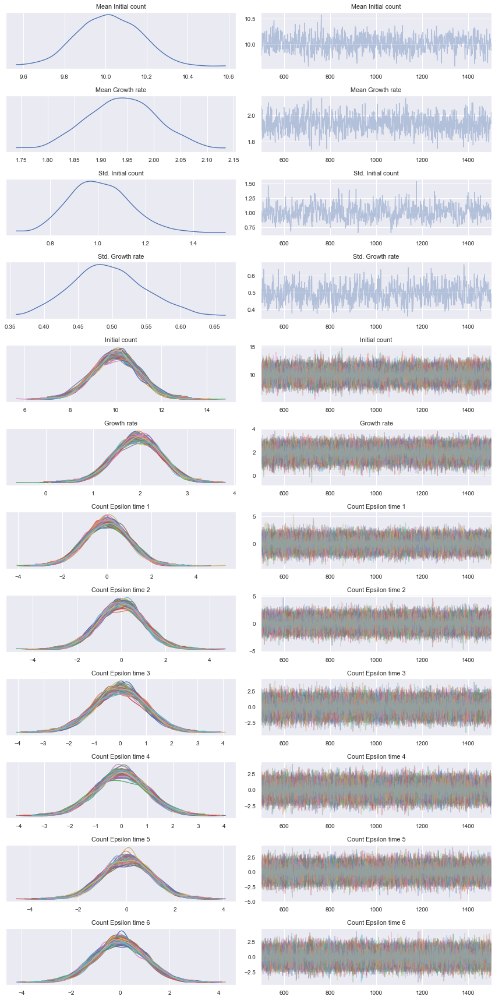

In [127]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1))      # Std. exponential growth
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1])

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

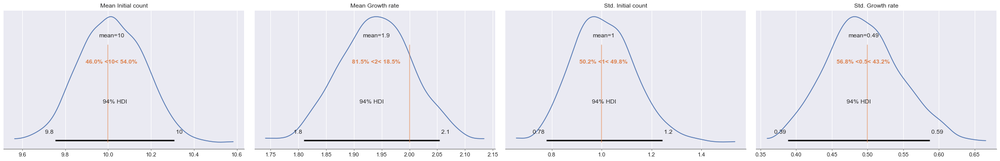

In [82]:
warmup = 500
thinning = 1
az.plot_posterior(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)),
    var_names=[
        'Mean Initial count',
        'Mean Growth rate',
        'Std. Initial count',
        'Std. Growth rate'],
    ref_val=population_parameters[:-1])
plt.tight_layout()

### Results

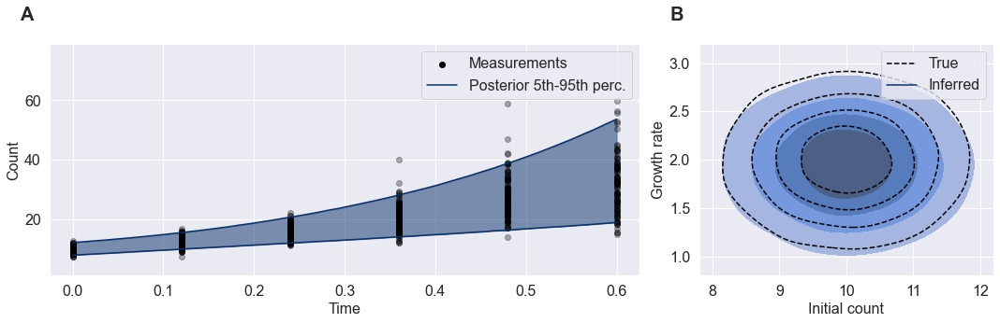

In [83]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1]})

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_filter.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 2))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])

# Plot population filter inference results (measurement space)
times = np.linspace(0, 0.6)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters[:, :2] = samples
parameters[:, 2] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th perc.')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([7.8, 12.2])
axes[1].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize)
axes[1].legend(fontsize=fontsize)

# Label subplot groups
axes[0].text(
    -0.05, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes,
    size=20, weight='bold')
axes[1].text(
    -0.1, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

plt.savefig('exponential_growth_model_pfi_inference_results.pdf',
    bbox_inches='tight')
plt.tight_layout()

poster

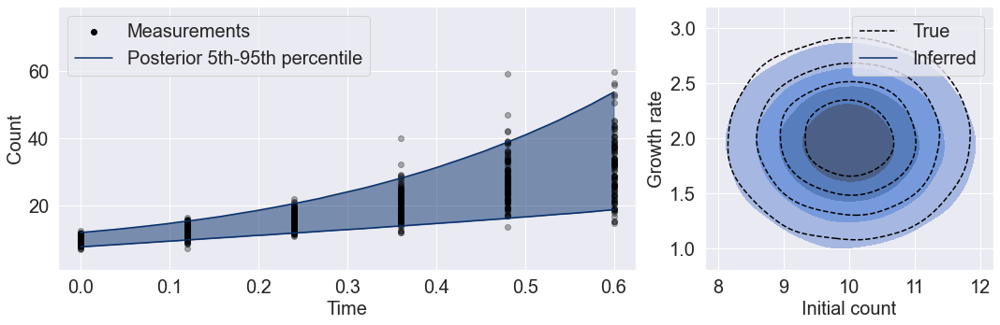

In [86]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1]})

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_filter.sel(draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 2))
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])

# Plot population filter inference results (measurement space)
times = np.linspace(0, 0.6)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters[:, :2] = samples
parameters[:, 2] = population_parameters[-1]
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Legend, ranges axes labels
fontsize = 20
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th percentile')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([7.8, 12.2])
axes[1].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize, loc='upper left')
axes[1].legend(fontsize=fontsize)

plt.savefig('exponential_growth_model_pfi_inference_results_poster.pdf',
    bbox_inches='tight')
plt.tight_layout()

## For presentation

### Only data-generating process (non-snapshot)

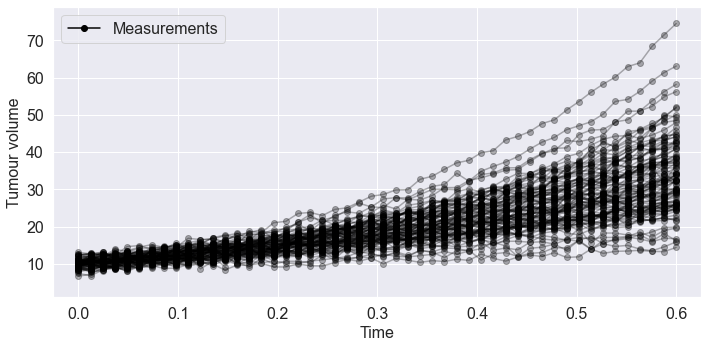

In [40]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    # if idm == 0:
    #     continue
    ax.plot(
        times, meas[0], color='black', marker='o', linestyle='solid',
        alpha=0.3)

# # Highlight one sample
# ax.plot(times, measurements[0, 0], color='red', marker='o', linestyle='solid')

# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour volume', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.plot(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
ax.set_xlim([-0.025, 0.625])
ax.set_ylim([1, 79])
ax.legend(fontsize=fontsize)
plt.savefig('temp.pdf', bbox_inches='tight')
plt.tight_layout()

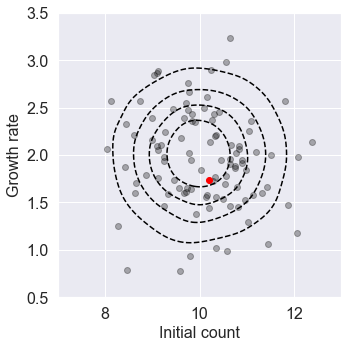

In [111]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Plot data-generating distribution as reference to parameter space
seed = np.random.default_rng(3)
n_samples = 50000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=ax)

# Illustrate samples corresponding to the measurements
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
seed = 2
n_ids = 100
samples = population_model.sample(
    population_parameters, n_samples=n_ids, seed=seed)[:, :2]
for idm, sample in enumerate(samples):
    if idm == 0:
        continue
    ax.scatter(
        sample[0], sample[1], color='black', marker='o', alpha=0.3)
ax.scatter(
        samples[0, 0], samples[0, 1], color='red', marker='o')

# Legend, ranges axes labels
fontsize = 16
ax.set_xlim([7, 13])
ax.set_ylim([0.5, 3.5])
ax.set_xlabel('Initial count', fontsize=fontsize)
ax.set_ylabel('Growth rate', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
plt.savefig('temp.pdf', bbox_inches='tight')
plt.tight_layout()

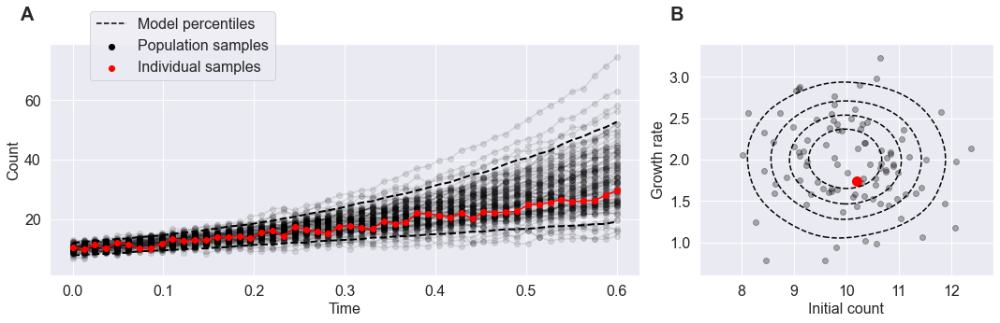

In [67]:
import string

# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1]})

# Plot data-generating distribution as reference to parameter space
seed = np.random.default_rng(3)
n_samples = 50000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=2, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Illustrate samples corresponding to the measurements
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
seed = 2
n_ids = 100
samples = population_model.sample(
    population_parameters, n_samples=n_ids, seed=seed)[:, :2]
for idm, sample in enumerate(samples):
    if idm == 0:
        continue
    axes[1].scatter(
        sample[0], sample[1], color='black', marker='o', alpha=0.3)
axes[1].scatter(
        samples[0, 0], samples[0, 1], color='red', marker='o', s=100)

# Plot data-generating distribution as reference to measurement space
n_samples = 1000
samples = predictive_model.sample(
    population_parameters, times, n_samples=n_samples, seed=seed,
    return_df=False)
fifth = np.percentile(samples, 5, axis=2)
ninetyfifth = np.percentile(samples, 95, axis=2)
axes[0].plot(times, fifth[0], color='black', linestyle='dashed', linewidth=2)
axes[0].plot(
    times, ninetyfifth[0], color='black', linestyle='dashed', linewidth=2)

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    if idm == 0:
        continue
    axes[0].plot(
        times, meas[0], color='black', marker='o', linestyle='solid',
        alpha=0.1)

# Highlight one sample
axes[0].plot(
    times, measurements[0, 0], color='red', marker='o', linestyle='solid')

# Label subplot groups
axes[0].text(
    -0.05, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.1, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].plot(
    [100, 101], [100, 101], color='black', linestyle='dashed',
    label='Model percentiles')
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Population samples')
axes[0].scatter(
    [100, 101], [100, 101], color='red', linestyle='solid', marker='o',
    label='Individual samples')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].set_xlim([7.2, 12.8])
axes[1].set_ylim([0.6, 3.4])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
fig.legend(fontsize=fontsize, loc=[0.09, 0.75])
plt.savefig(
    'exponential_growth_model_data_generating_process.pdf',
    bbox_inches='tight')
plt.tight_layout()

poster

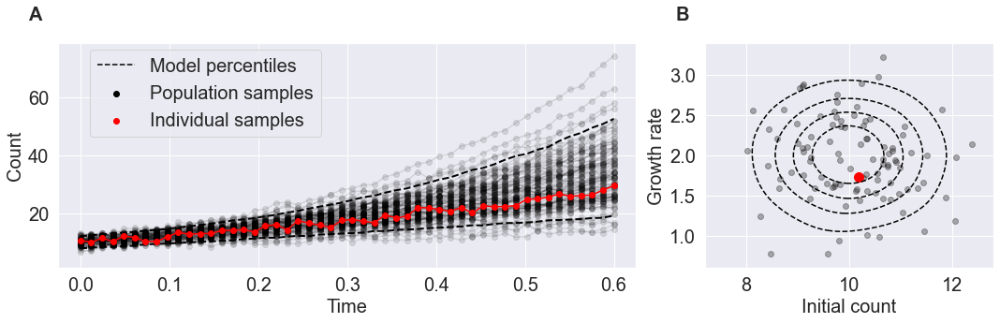

In [75]:
import string

# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1]})

# Plot data-generating distribution as reference to parameter space
seed = np.random.default_rng(3)
n_samples = 50000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=2, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Illustrate samples corresponding to the measurements
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
seed = 2
n_ids = 100
samples = population_model.sample(
    population_parameters, n_samples=n_ids, seed=seed)[:, :2]
for idm, sample in enumerate(samples):
    if idm == 0:
        continue
    axes[1].scatter(
        sample[0], sample[1], color='black', marker='o', alpha=0.3)
axes[1].scatter(
        samples[0, 0], samples[0, 1], color='red', marker='o', s=100)

# Plot data-generating distribution as reference to measurement space
n_samples = 1000
samples = predictive_model.sample(
    population_parameters, times, n_samples=n_samples, seed=seed,
    return_df=False)
fifth = np.percentile(samples, 5, axis=2)
ninetyfifth = np.percentile(samples, 95, axis=2)
axes[0].plot(times, fifth[0], color='black', linestyle='dashed', linewidth=2)
axes[0].plot(
    times, ninetyfifth[0], color='black', linestyle='dashed', linewidth=2)

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    if idm == 0:
        continue
    axes[0].plot(
        times, meas[0], color='black', marker='o', linestyle='solid',
        alpha=0.1)

# Highlight one sample
axes[0].plot(
    times, measurements[0, 0], color='red', marker='o', linestyle='solid')

# Label subplot groups
axes[0].text(
    -0.05, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.1, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 20
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].plot(
    [100, 101], [100, 101], color='black', linestyle='dashed',
    label='Model percentiles')
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Population samples')
axes[0].scatter(
    [100, 101], [100, 101], color='red', linestyle='solid', marker='o',
    label='Individual samples')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].set_xlim([7.2, 12.8])
axes[1].set_ylim([0.6, 3.4])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
fig.legend(fontsize=fontsize, loc=[0.09, 0.575])
plt.savefig(
    'exponential_growth_model_data_generating_process_poster.pdf',
    bbox_inches='tight')
plt.tight_layout()

### Only data-generating process (snapshot data)

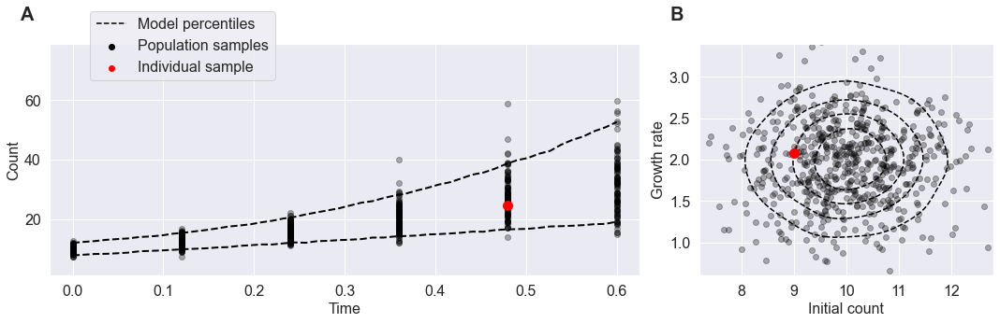

In [77]:
import string

# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1]})

# Plot population filter inference results (parameter space)
seed = 2
n_samples = 10000

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    population_parameters, n_samples, seed)[:, :2]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot samples corresponding to measurements
axes[1].scatter(
    samples[:6*100, 0], samples[:6*100, 1], color='black', marker='o',
    alpha=0.3)
axes[1].scatter(
        samples[100*4, 0], samples[100*4, 1], color='red', marker='o', alpha=1,
        s=100, zorder=10)

# Plot data-generating distribution as reference to measurement space
n_samples = 1000
times = np.linspace(0, 0.6)
samples = predictive_model.sample(
    population_parameters, times, n_samples=n_samples, seed=seed,
    return_df=False)
fifth = np.percentile(samples, 5, axis=2)
ninetyfifth = np.percentile(samples, 95, axis=2)
axes[0].plot(times, fifth[0], color='black', linestyle='dashed', linewidth=2)
axes[0].plot(
    times, ninetyfifth[0], color='black', linestyle='dashed', linewidth=2)

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Highlight one sample
axes[0].scatter(
        [times[4]], [measurements[0, 0, 4]], color='red', marker='o', s=100)

# Label subplot groups
axes[0].text(
    -0.05, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.1, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].plot(
    [100, 101], [100, 101], color='black', linestyle='dashed',
    label='Model percentiles')
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Population samples')
axes[0].scatter(
    [100, 101], [100, 101], color='red', linestyle='solid', marker='o',
    label='Individual sample')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].set_xlim([7.2, 12.8])
axes[1].set_ylim([0.6, 3.4])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
fig.legend(fontsize=fontsize, loc=[0.09, 0.75])
plt.savefig(
    'exponential_growth_model_snapshot_data.pdf',
    bbox_inches='tight')
plt.tight_layout()

poster

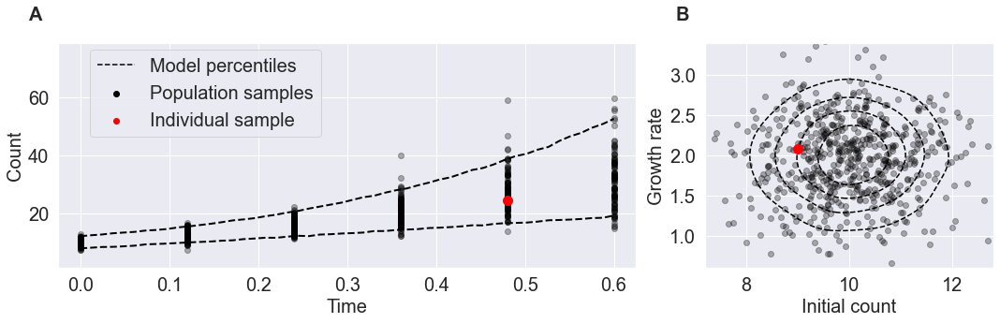

In [79]:
import string

# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1]})

# Plot population filter inference results (parameter space)
seed = 2
n_samples = 10000

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    population_parameters, n_samples, seed)[:, :2]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot samples corresponding to measurements
axes[1].scatter(
    samples[:6*100, 0], samples[:6*100, 1], color='black', marker='o',
    alpha=0.3)
axes[1].scatter(
        samples[100*4, 0], samples[100*4, 1], color='red', marker='o', alpha=1,
        s=100, zorder=10)

# Plot data-generating distribution as reference to measurement space
n_samples = 1000
times = np.linspace(0, 0.6)
samples = predictive_model.sample(
    population_parameters, times, n_samples=n_samples, seed=seed,
    return_df=False)
fifth = np.percentile(samples, 5, axis=2)
ninetyfifth = np.percentile(samples, 95, axis=2)
axes[0].plot(times, fifth[0], color='black', linestyle='dashed', linewidth=2)
axes[0].plot(
    times, ninetyfifth[0], color='black', linestyle='dashed', linewidth=2)

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Highlight one sample
axes[0].scatter(
        [times[4]], [measurements[0, 0, 4]], color='red', marker='o', s=100)

# Label subplot groups
axes[0].text(
    -0.05, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.1, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 20
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].plot(
    [100, 101], [100, 101], color='black', linestyle='dashed',
    label='Model percentiles')
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Population samples')
axes[0].scatter(
    [100, 101], [100, 101], color='red', linestyle='solid', marker='o',
    label='Individual sample')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].set_xlim([7.2, 12.8])
axes[1].set_ylim([0.6, 3.4])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
fig.legend(fontsize=fontsize, loc=[0.09, 0.575])
plt.savefig(
    'exponential_growth_model_snapshot_data_poster.pdf',
    bbox_inches='tight')
plt.tight_layout()

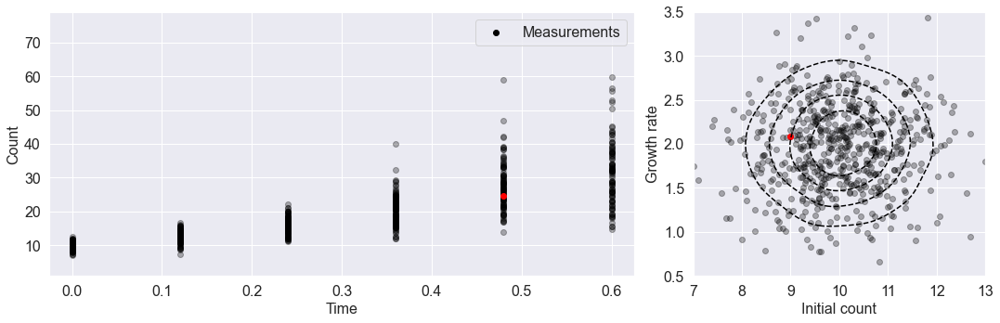

In [132]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1]})

# Plot population filter inference results (parameter space)
seed = 2
n_samples = 10000

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(
    population_parameters, n_samples, seed)[:, :2]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])

# Plot samples corresponding to measurements
axes[1].scatter(
    samples[:6*100, 0], samples[:6*100, 1], color='black', marker='o',
    alpha=0.3)
axes[1].scatter(
        samples[100*4, 0], samples[100*4, 1], color='red', marker='o', alpha=1)

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Highlight one sample
axes[0].scatter(
        [times[4]], [measurements[0, 0, 4]], color='red', marker='o')

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].set_xlim([7, 13])
axes[1].set_ylim([0.5, 3.5])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize)
plt.savefig('temp.pdf', bbox_inches='tight')
plt.tight_layout()

### Visualise population filters

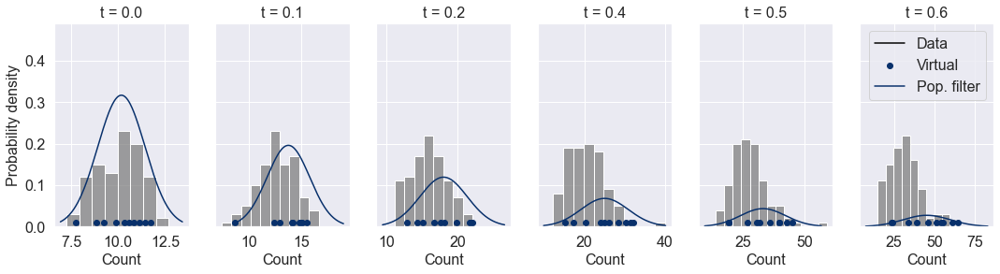

In [182]:
from scipy.stats import norm

# Sample virtual measurements
seed = 6
n_ids = 10
virt_meas = predictive_model.sample(
    population_parameters, times, n_ids, seed, return_df=False)

# Visualise distributions over time
fontsize = '16'
fig, axes = plt.subplots(
    1, len(times), figsize=(18, 4), sharey='row')
axes[0].set_ylabel('Probability density', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[tid].set_xlabel('Count', fontsize=fontsize)
    axes[tid].tick_params(labelsize=fontsize)

    # Plot hist over measurements plot
    sns.histplot(
        x=measurements[:, 0, tid], fill=True, linewidth=1, ax=axes[tid],
        legend=False, color='grey', stat='probability')

# Plot virtual measurements
for tid in range(len(times)):
    axes[tid].scatter(
        x=virt_meas[0, tid], y=[0.01] * n_ids, color=plt.get_cmap('Blues_r')(0))

# Visualise population filters
mu = np.mean(virt_meas[0], axis=1)
sigma = np.std(virt_meas[0], axis=1, ddof=1)
for tid in range(len(times)):
    start = norm(mu[tid], sigma[tid]).ppf(0.005)
    stop = norm(mu[tid], sigma[tid]).ppf(0.995)
    xs = np.linspace(start, stop, 200)
    pdf = norm(mu[tid], sigma[tid]).pdf(xs)
    axes[tid].plot(xs, pdf, color=plt.get_cmap('Blues_r')(0))

# Add legend
axes[0].set_ylim([0, 0.49])
axes[-1].plot([25, 25], [1, 1], color='black', label='Data')
axes[-1].scatter([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Virtual')
axes[-1].plot([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Pop. filter')
plt.legend(fontsize=fontsize)
plt.savefig('temp.pdf', bbox_inches='tight')
plt.show()

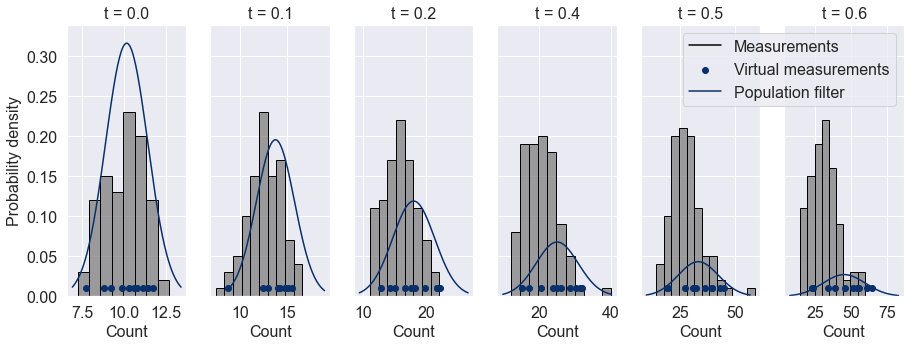

In [57]:
from scipy.stats import norm

# Sample virtual measurements
seed = 6
n_ids = 10
virt_meas = predictive_model.sample(
    population_parameters, times, n_ids, seed, return_df=False)

# Visualise distributions over time
fontsize = '16'
fig, axes = plt.subplots(
    1, len(times), figsize=(15, 5), sharey='row')
axes[0].set_ylabel('Probability density', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[tid].set_xlabel('Count', fontsize=fontsize)
    axes[tid].tick_params(labelsize=fontsize)

    # Plot hist over measurements plot
    sns.histplot(
        x=measurements[:, 0, tid], fill=True, linewidth=1, ax=axes[tid],
        legend=False, color='grey', stat='probability', edgecolor='black')

# Plot virtual measurements
for tid in range(len(times)):
    axes[tid].scatter(
        x=virt_meas[0, tid], y=[0.01] * n_ids,
        color=plt.get_cmap('Blues_r')(0))

# Visualise population filters
mu = np.mean(virt_meas[0], axis=1)
sigma = np.std(virt_meas[0], axis=1, ddof=1)
for tid in range(len(times)):
    start = norm(mu[tid], sigma[tid]).ppf(0.005)
    stop = norm(mu[tid], sigma[tid]).ppf(0.995)
    xs = np.linspace(start, stop, 200)
    pdf = norm(mu[tid], sigma[tid]).pdf(xs)
    axes[tid].plot(xs, pdf, color=plt.get_cmap('Blues_r')(0))

# Add legend
axes[0].set_ylim([0, 0.34])
axes[-1].plot([25, 25], [1, 1], color='black', label='Measurements')
axes[-1].scatter([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Virtual measurements')
axes[-1].plot([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Population filter')
plt.legend(fontsize=fontsize)
plt.savefig('gaussian_population_filter.pdf', bbox_inches='tight')
plt.show()

poster

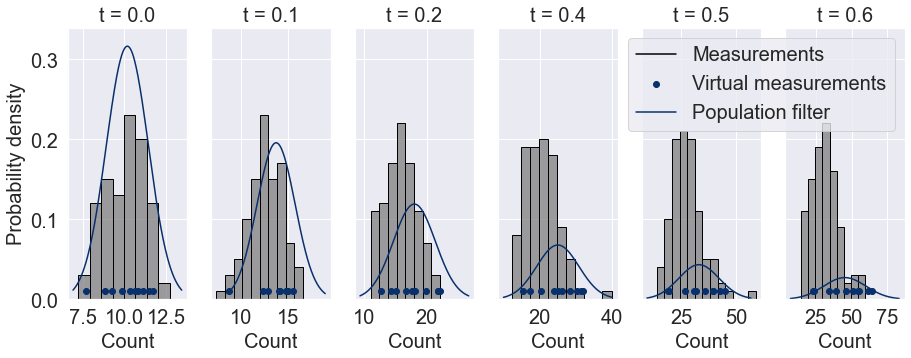

In [80]:
from scipy.stats import norm

# Sample virtual measurements
seed = 6
n_ids = 10
virt_meas = predictive_model.sample(
    population_parameters, times, n_ids, seed, return_df=False)

# Visualise distributions over time
fontsize = '20'
fig, axes = plt.subplots(
    1, len(times), figsize=(15, 5), sharey='row')
axes[0].set_ylabel('Probability density', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[tid].set_xlabel('Count', fontsize=fontsize)
    axes[tid].tick_params(labelsize=fontsize)

    # Plot hist over measurements plot
    sns.histplot(
        x=measurements[:, 0, tid], fill=True, linewidth=1, ax=axes[tid],
        legend=False, color='grey', stat='probability', edgecolor='black')

# Plot virtual measurements
for tid in range(len(times)):
    axes[tid].scatter(
        x=virt_meas[0, tid], y=[0.01] * n_ids,
        color=plt.get_cmap('Blues_r')(0))

# Visualise population filters
mu = np.mean(virt_meas[0], axis=1)
sigma = np.std(virt_meas[0], axis=1, ddof=1)
for tid in range(len(times)):
    start = norm(mu[tid], sigma[tid]).ppf(0.005)
    stop = norm(mu[tid], sigma[tid]).ppf(0.995)
    xs = np.linspace(start, stop, 200)
    pdf = norm(mu[tid], sigma[tid]).pdf(xs)
    axes[tid].plot(xs, pdf, color=plt.get_cmap('Blues_r')(0))

# Add legend
axes[0].set_ylim([0, 0.34])
axes[-1].plot([25, 25], [1, 1], color='black', label='Measurements')
axes[-1].scatter([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Virtual measurements')
axes[-1].plot([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Population filter')
plt.legend(fontsize=fontsize)
plt.savefig('gaussian_population_filter_poster.pdf', bbox_inches='tight')
plt.show()

## Presentation

### NLME inference from 20 snapshot measurements per t

In [10]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 20
n_times = len(times)
n_observables = 1
measurements = np.empty(shape=(n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:, 0, idt] = dense_measurements[0, idt, start_ids:end_ids]

# Visualise measurements
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 0, idt]],
            mode='markers+lines',
            name='ID %d' % (idt + (n_times * idx))
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.


/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:258: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:157: RuntimeWarning:

overflow encountered in exp



Iter. Eval. Accept.   Steps. Time m:s
0     79     0.5      32       0:00.6
1     80     0.25     1        0:00.6
2     81     0.25     1        0:00.6
3     84     0.5      2        0:00.7
20    2246   0.843    121      0:18.3
40    16701  0.804    689      2:09.5
60    31535  0.757561 707      4:00.1
80    48050  0.806    787      6:04.7
100   63191  0.756    721      7:57.2
120   65020  0.731    88       8:11.1
140   67081  0.754    99       8:26.8
160   68576  0.752    71       8:38.2
180   70234  0.75     79       8:51.2
200   71372  0.754    55       9:00.5
220   72985  0.753    77       9:13.4
240   73964  0.739    47       9:21.4
260   75040  0.734    51       9:29.5
280   77423  0.753    114      9:47.7
300   79653  0.756    107     10:04.8
320   80661  0.772    48      10:12.4
340   81908  0.722    60      10:22.2
360   83072  0.784    56      10:31.1
380   84156  0.742    52      10:39.6
400   85736  0.766    76      10:52.4
420   87636  0.766263 91      11:07.4
440   89312 

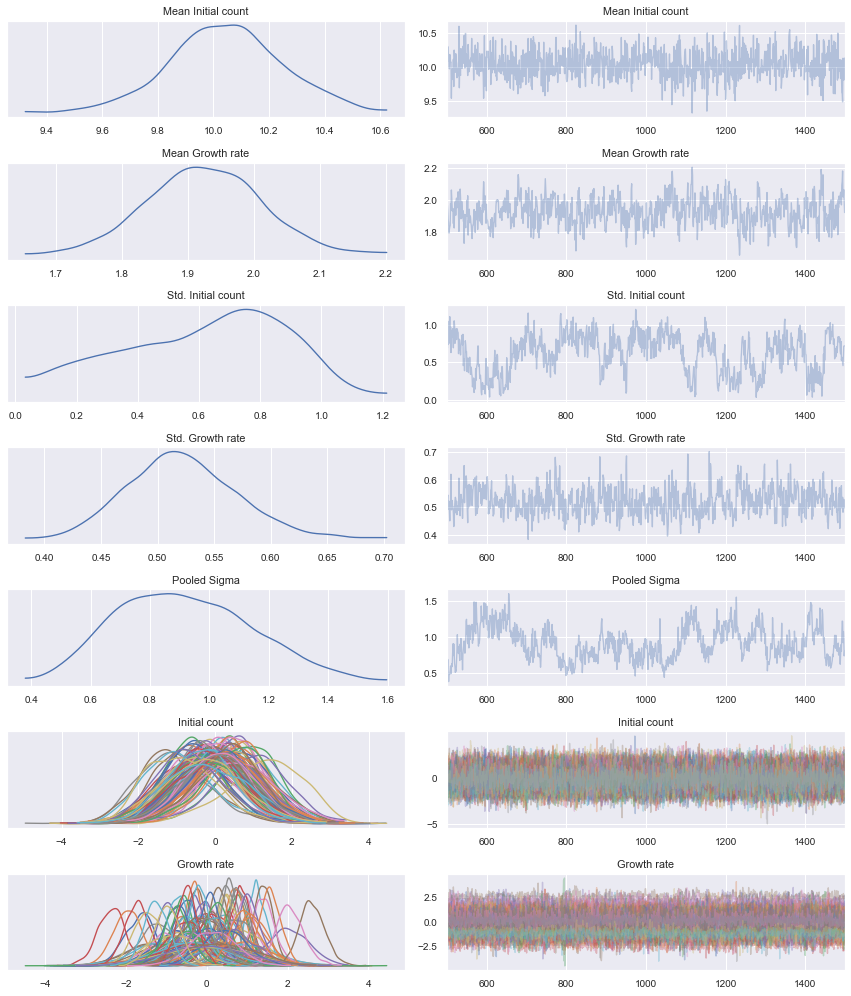

In [11]:
# Format data as dataframe
n_times = len(times)
measurements_df = pd.DataFrame({
    'Observable': 'Count',
    'Value': measurements.flatten(),
    'ID': np.arange(1, len(measurements.flatten()) + 1),
    'Time': np.broadcast_to(times[np.newaxis, :], (n_ids, n_times)).flatten()
})

# Define hierarchical log-posterior
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=False),
    chi.PooledModel(dim_names=['Sigma'])])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1),      # Std. exponential growth
    pints.LogNormalLogPrior(-1, 1))      # Sigma
problem = chi.ProblemModellingController(mechanistic_model, error_model)
# problem.fix_parameters({'Sigma': population_parameters[-1]})
problem.set_population_model(population_model)
problem.set_data(measurements_df)
problem.set_log_prior(log_prior)
log_posterior = problem.get_log_posterior()

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_hierarchical = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_hierarchical.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

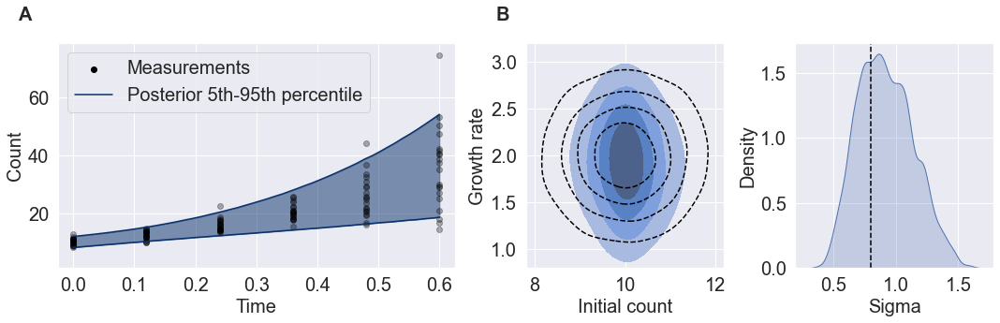

In [38]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1, 1]})

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_hierarchical.sel(
    draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten(),
    parameters['Pooled Sigma'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 3))
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=True),
    chi.PooledModel()])
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])
sns.kdeplot(
    x=samples[:, 2], fill=True, ax=axes[2], bw_adjust=1.5)

# Plot population filter inference results (measurement space)
times = np.linspace(0, 0.6)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters = samples
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters, n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])
axes[2].axvline(population_parameters[-1], color='black', linestyle='--')

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Label subplot groups
axes[0].text(
    -0.1, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.15, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 20
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th percentile')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([7.8, 12.2])
axes[1].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize, loc='upper left')
# axes[1].legend(fontsize=fontsize)
axes[2].tick_params(labelsize=fontsize)
axes[2].set_xlabel('Sigma', fontsize=fontsize)
axes[2].set_ylabel('Density', fontsize=fontsize)

plt.savefig(
    'hierarchical_exponential_growth_model_inference_20_per_t.pdf',
    bbox_inches='tight')
plt.tight_layout()

### PFI

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     13     0.5      4        0:00.0
1     14     0.25     1        0:00.0
2     37     0.0208   12       0:00.1
3     164    0.5      64       0:00.3
20    2730   0.809    143      0:04.5
40    6215   0.764    166      0:09.9
60    9617   0.753    162      0:15.4
80    12253  0.761    126      0:19.5
100   14438  0.77     104      0:23.3
120   14993  0.713    27       0:24.2
140   15435  0.745    22       0:24.9
160   15947  0.699527 25       0:25.7
180   16586  0.764    31       0:26.9
200   17549  0.73     46       0:28.7
220   18039  0.78507  24       0:29.6
240   18331  0.765    14       0:30.0
260   18667  0.696    16       0:30.6
280   19098  0.761    21       0:31.4
300   19630  0.746    26       0:32.4
320   20019  0.757    19       0:33.0
340   20476  0.756    22       0:33.8
360   20847  0.76     18       0:34.5
380   21236  0.751962 19       0:35.1
400   21538  0.757

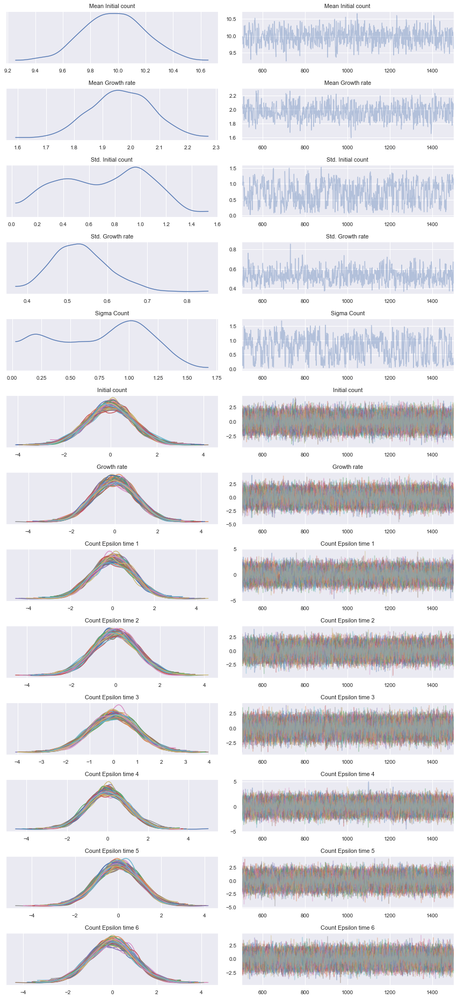

In [40]:
# Define hierarchical log-posterior
population_filter = chi.GaussianFilter(observations=measurements)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=False)])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1),      # Std. exponential growth
    pints.LogNormalLogPrior(-1, 1))      # Sigma
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior)

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

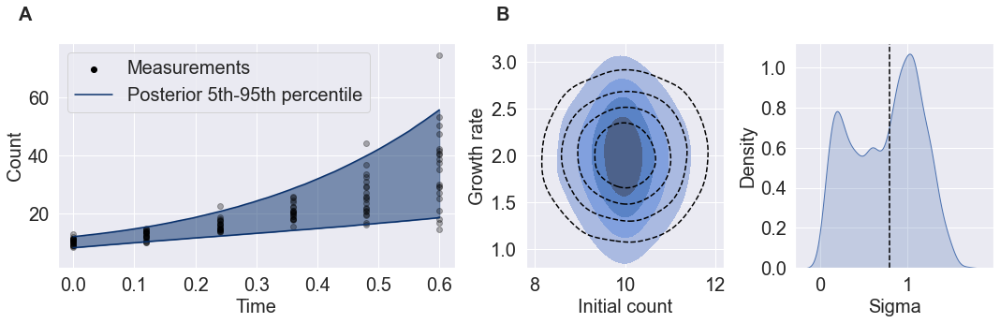

In [44]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1, 1]})

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_filter.sel(
    draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten(),
    parameters['Sigma Count'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 3))
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=True),
    chi.PooledModel()])
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])
sns.kdeplot(
    x=samples[:, 2], fill=True, ax=axes[2], bw_adjust=1.5)

# Plot population filter inference results (measurement space)
times = np.linspace(0, 0.6)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters = samples
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters, n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])
axes[2].axvline(population_parameters[-1], color='black', linestyle='--')

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Label subplot groups
axes[0].text(
    -0.1, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.15, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 20
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th percentile')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([7.8, 12.2])
axes[1].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize, loc='upper left')
# axes[1].legend(fontsize=fontsize)
axes[2].tick_params(labelsize=fontsize)
axes[2].set_xlabel('Sigma', fontsize=fontsize)
axes[2].set_ylabel('Density', fontsize=fontsize)

plt.savefig(
    'hierarchical_exponential_growth_model_pfi_20_per_t.pdf',
    bbox_inches='tight')
plt.tight_layout()

more measurements

In [60]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 1
n_times = len(times)
n_observables = 1
measurements = np.empty(shape=(n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:, 0, idt] = dense_measurements[0, idt, start_ids:end_ids]

# Visualise measurements
fig = go.Figure()
for idt in range(n_times):
    for idx in range(n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 0, idt]],
            mode='markers+lines',
            name='ID %d' % (idt + (n_times * idx))
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

NLME inference

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     16     0.5      1        0:00.0
1     17     0.25     1        0:00.0
2     18     0.25     1        0:00.0
3     19     0.5      1        0:00.0
20    116    0.87     6        0:00.1


/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:258: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:157: RuntimeWarning:

overflow encountered in exp



40    3137   0.801    144      0:02.6
60    5590   0.729    117      0:04.6
80    16809  0.832    535      0:12.7
100   18601  0.766    86       0:13.9
120   20669  0.751    99       0:16.0
140   21525  0.719    41       0:16.6
160   22783  0.74     60       0:17.5
180   28242  0.745    260      0:21.5
200   29896  0.773    79       0:22.7
220   31092  0.748818 57       0:23.8
240   32364  0.747    61       0:24.8
260   34087  0.722    82       0:26.0
280   35628  0.703    74       0:27.3
300   40842  0.743    249      0:31.6
320   47979  0.739    340      0:36.7
340   58234  0.761    489      0:44.1
360   69990  0.75     560      0:52.6
380   77850  0.791    375      0:58.3
400   82726  0.748    233      1:02.0
420   95774  0.682    622      1:11.4
440   106654  0.824    519      1:19.3
460   110981  0.721    206      1:22.7
480   117268  0.757    300      1:27.3
500   129456  0.743    581      1:36.1
520   138750  0.933    443      1:42.9
540   149290  0.94879  502      1:50.6
560   

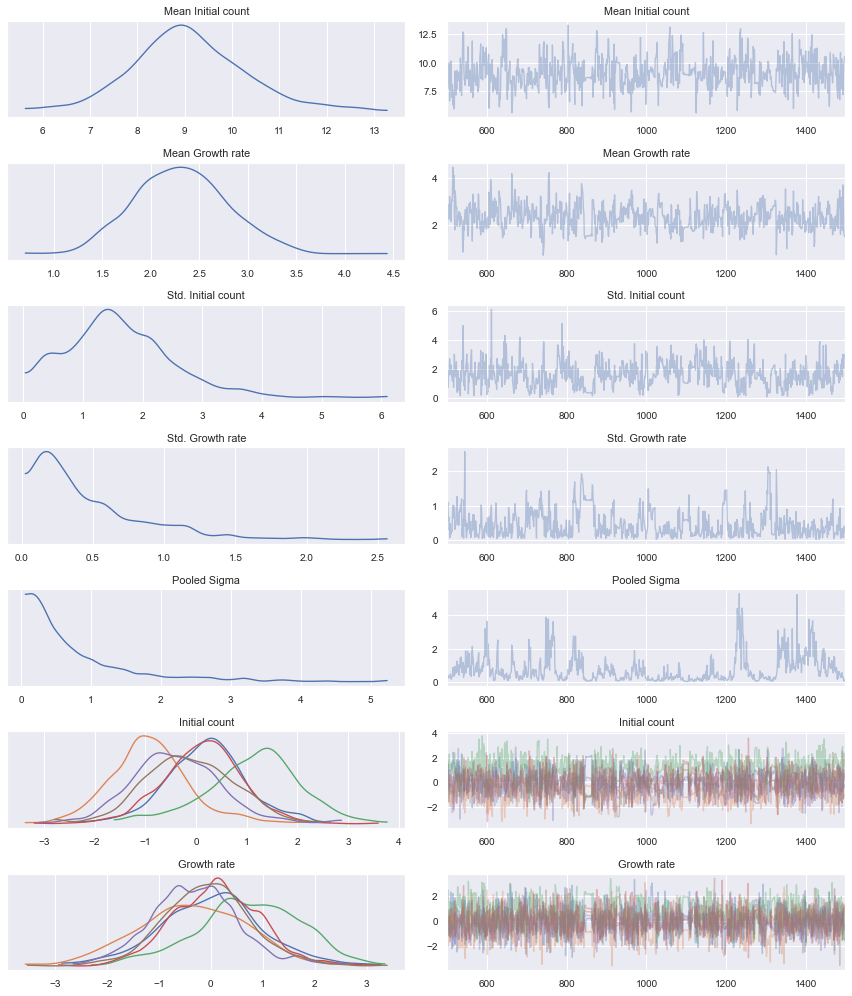

In [61]:
# Format data as dataframe
n_times = len(times)
measurements_df = pd.DataFrame({
    'Observable': 'Count',
    'Value': measurements.flatten(),
    'ID': np.arange(1, len(measurements.flatten()) + 1),
    'Time': np.broadcast_to(times[np.newaxis, :], (n_ids, n_times)).flatten()
})

# Define hierarchical log-posterior
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=False),
    chi.PooledModel(dim_names=['Sigma'])])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1),      # Std. exponential growth
    pints.LogNormalLogPrior(-1, 1))      # Sigma
problem = chi.ProblemModellingController(mechanistic_model, error_model)
# problem.fix_parameters({'Sigma': population_parameters[-1]})
problem.set_population_model(population_model)
problem.set_data(measurements_df)
problem.set_log_prior(log_prior)
log_posterior = problem.get_log_posterior()

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_hierarchical = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_hierarchical.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

In [62]:
posterior_samples_hierarchical

<xarray.Dataset>
Dimensions:             (chain: 1, draw: 1500, individual: 6)
Coordinates:
  * chain               (chain) int64 0
  * draw                (draw) int64 0 1 2 3 4 5 ... 1495 1496 1497 1498 1499
  * individual          (individual) <U1 '1' '2' '3' '4' '5' '6'
Data variables:
    Mean Initial count  (chain, draw) float64 7.749 7.749 7.749 ... 10.51 10.56
    Mean Growth rate    (chain, draw) float64 4.829 4.829 4.829 ... 1.493 1.56
    Std. Initial count  (chain, draw) float64 0.1074 0.1074 ... 2.975 2.875
    Std. Growth rate    (chain, draw) float64 1.889 1.889 ... 0.2343 0.2329
    Pooled Sigma        (chain, draw) float64 0.1425 0.1425 ... 0.1116 0.2044
    Initial count       (chain, draw, individual) float64 2.041 0.4181 ... 1.295
    Growth rate         (chain, draw, individual) float64 -2.556 ... -0.3957
Attributes:
    divergent iterations:          true
    divergent iterations chain 0:  [   2    3    5    7   11   13   16   17  ...

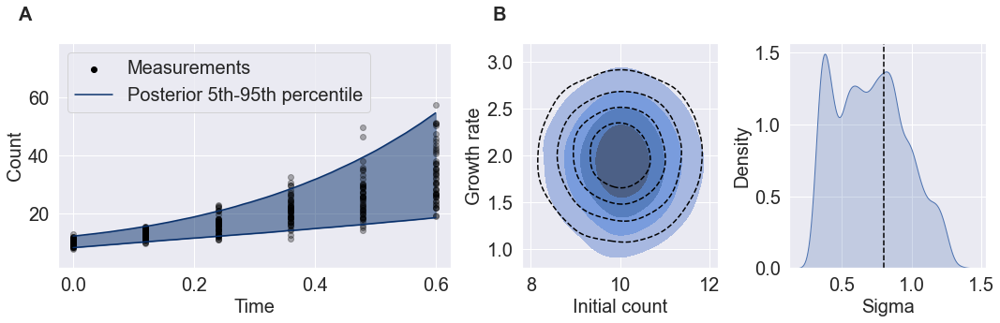

In [50]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1, 1]})

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_hierarchical.sel(
    draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten(),
    parameters['Pooled Sigma'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 3))
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=True),
    chi.PooledModel()])
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])
sns.kdeplot(
    x=samples[:, 2], fill=True, ax=axes[2], bw_adjust=1.5)

# Plot population filter inference results (measurement space)
times = np.linspace(0, 0.6)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters = samples
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters, n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])
axes[2].axvline(population_parameters[-1], color='black', linestyle='--')

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Label subplot groups
axes[0].text(
    -0.1, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.15, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 20
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th percentile')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([7.8, 12.2])
axes[1].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize, loc='upper left')
# axes[1].legend(fontsize=fontsize)
axes[2].tick_params(labelsize=fontsize)
axes[2].set_xlabel('Sigma', fontsize=fontsize)
axes[2].set_ylabel('Density', fontsize=fontsize)

# plt.savefig(
#     'hierarchical_exponential_growth_model_inference_50_per_t.pdf',
#     bbox_inches='tight')
plt.tight_layout()

PFI

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     68     0.28     33       0:00.2
1     82     0.463    7        0:00.2
2     88     0.429    3        0:00.2
3     93     0.415    3        0:00.2
20    1322   0.715    69       0:02.5
40    4020   0.787    129      0:07.5
60    9899   0.733    280      0:17.0
80    16983  0.757    338      0:28.0
100   19591  0.769393 125      0:32.2
120   20102  0.716    25       0:33.0
140   21556  0.723    70       0:35.4
160   24202  0.71     126      0:39.7
180   25566  0.779    65       0:42.0
200   26287  0.76     35       0:43.1
220   28073  0.712    86       0:46.4
240   29132  0.797    51       0:48.3
260   29955  0.695    40       0:49.6
280   30566  0.757    30       0:50.8
300   31414  0.747    41       0:52.6
320   32247  0.731    40       0:54.0
340   33651  0.758    67       0:56.7
360   34516  0.734    42       0:58.2
380   35693  0.802    57       1:00.9
400   36419  0.739

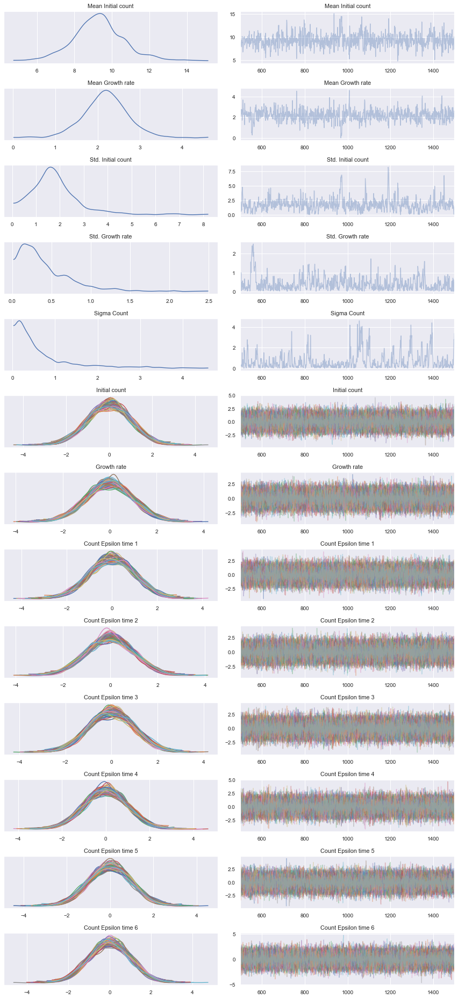

In [63]:
# Define hierarchical log-posterior
population_filter = chi.GaussianFilter(observations=measurements)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=False)])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1),      # Std. exponential growth
    pints.LogNormalLogPrior(-1, 1))      # Sigma
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior)

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

In [64]:
posterior_samples_filter

<xarray.Dataset>
Dimensions:               (chain: 1, draw: 1500, individual: 100)
Coordinates:
  * chain                 (chain) int64 0
  * draw                  (draw) int64 0 1 2 3 4 5 ... 1495 1496 1497 1498 1499
  * individual            (individual) <U8 'Sim. 1' 'Sim. 2' ... 'Sim. 100'
Data variables: (12/13)
    Mean Initial count    (chain, draw) float64 8.083 9.291 9.12 ... 7.336 8.803
    Mean Growth rate      (chain, draw) float64 4.347 4.053 3.696 ... 2.63 2.415
    Std. Initial count    (chain, draw) float64 4.681 4.573 4.11 ... 1.031 1.466
    Std. Growth rate      (chain, draw) float64 0.5004 1.212 ... 0.1508 0.1082
    Sigma Count           (chain, draw) float64 2.571 2.376 2.249 ... 2.38 3.389
    Initial count         (chain, draw, individual) float64 2.018 ... 0.01851
    ...                    ...
    Count Epsilon time 1  (chain, draw, individual) float64 1.784 ... 1.0
    Count Epsilon time 2  (chain, draw, individual) float64 0.1452 ... -0.1144
    Count Epsilon time 3  (chain, draw, individual) float64 0.1936 ... 0.6767
    Count Epsilon time 4  (chain, draw, individual) float64 -0.5694 ... 1.376
    Count Epsilon time 5  (chain, draw, individual) float64 -1.964 ... -0.4406
    Count Epsilon time 6  (chain, draw, individual) float64 -0.1667 ... 0.4921
Attributes:
    divergent iterations:          true
    divergent iterations chain 0:  [   1    2    3    4    5    6    7    8  ...

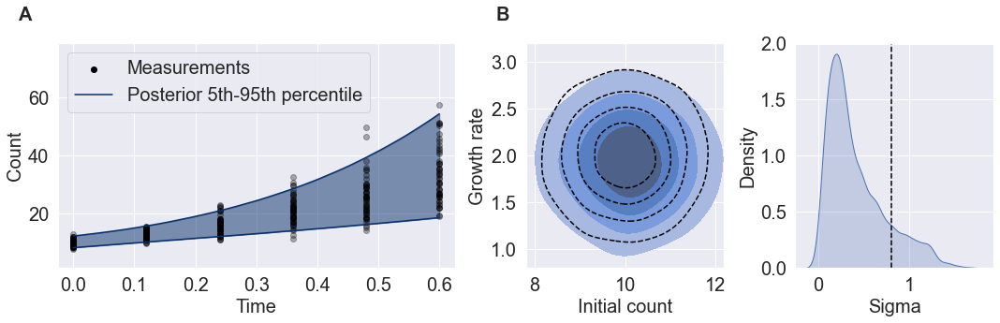

In [47]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(15, 5), gridspec_kw={'width_ratios': [2, 1, 1]})

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_filter.sel(
    draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten(),
    parameters['Sigma Count'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 3))
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=True),
    chi.PooledModel()])
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes[1])
sns.kdeplot(
    x=samples[:, 2], fill=True, ax=axes[2], bw_adjust=1.5)

# Plot population filter inference results (measurement space)
times = np.linspace(0, 0.6)
n_times = len(times)
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
simulated_measurements = np.empty(shape=(n_samples, n_times))
parameters = np.empty(shape=(n_samples, 3))
parameters = samples
for ids, sample in enumerate(parameters):
    simulated_measurements[ids, :] = predictive_model.sample(
        parameters=sample, times=times, seed=seed, return_df=False)[0, :, 0]
fifth_percentile = np.percentile(simulated_measurements, q=5, axis=0)
ninetyfifth_percentile = np.percentile(simulated_measurements, q=95, axis=0)
axes[0].plot(
    times, fifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].plot(
    times, ninetyfifth_percentile, color=plt.get_cmap('Blues_r')(0))
axes[0].fill_between(
    times, fifth_percentile, ninetyfifth_percentile,
    color=plt.get_cmap('Blues_r')(0), alpha=0.5)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters, n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])
axes[2].axvline(population_parameters[-1], color='black', linestyle='--')

# Plot measurement used for the inference as reference
times = np.linspace(0, 0.6, 6)
for idm, meas in enumerate(measurements):
    axes[0].scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Label subplot groups
axes[0].text(
    -0.1, 1.1, string.ascii_uppercase[0], transform=axes[0].transAxes, size=20,
    weight='bold')
axes[1].text(
    -0.15, 1.1, string.ascii_uppercase[1], transform=axes[1].transAxes,
    size=20, weight='bold')

# Legend, ranges axes labels
fontsize = 20
axes[0].set_xlabel('Time', fontsize=fontsize)
axes[0].set_ylabel('Count', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[0].scatter(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
axes[0].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),
    linestyle='solid', label='Posterior 5th-95th percentile')
axes[0].set_xlim([-0.025, 0.625])
axes[0].set_ylim([1, 79])
axes[1].plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes[1].plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes[1].set_xlim([7.8, 12.2])
axes[1].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Initial count', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[0].legend(fontsize=fontsize, loc='upper left')
# axes[1].legend(fontsize=fontsize)
axes[2].tick_params(labelsize=fontsize)
axes[2].set_xlabel('Sigma', fontsize=fontsize)
axes[2].set_ylabel('Density', fontsize=fontsize)

plt.savefig(
    'hierarchical_exponential_growth_model_pfi_50_per_t.pdf',
    bbox_inches='tight')
plt.tight_layout()

Dynamics of individual

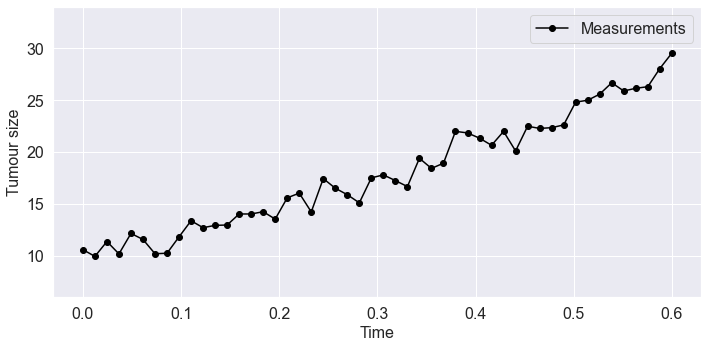

In [76]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Plot measurement used for the inference as reference

# Highlight one sample
ax.plot(
    times, measurements[0, 0], color='black', marker='o', linestyle='solid',
    label='Measurements')

# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour size', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
# ax.plot(
#     [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
#     label='Measurements')
# ax.set_xlim([-0.025, 0.625])
ax.set_ylim([6, 34])
ax.legend(fontsize=fontsize)
plt.savefig('individual_measurements.pdf', bbox_inches='tight')
plt.tight_layout()

Plot mechanistic model

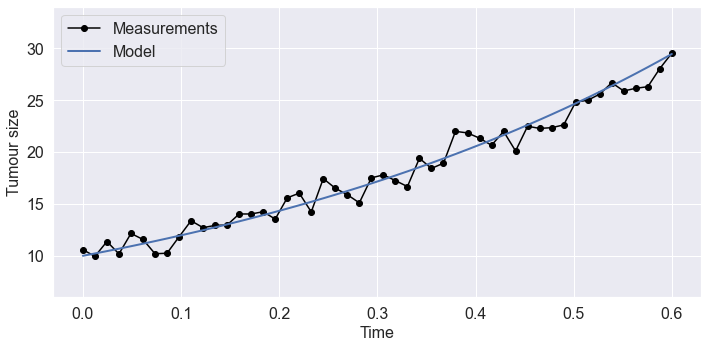

In [80]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Highlight one sample
ax.plot(
    times, measurements[0, 0], color='black', marker='o', linestyle='solid',
    label='Measurements')

# Plot mechanistic model
t = np.linspace(0, 0.6)
sim = mechanistic_model.simulate(
    parameters=[10, 1.8], times=t)
ax.plot(
    t, sim[0], color=sns.color_palette()[0], linestyle='solid',
    label='Model', linewidth=2)

# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour size', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
# ax.plot(
#     [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
#     label='Measurements')
# ax.set_xlim([-0.025, 0.625])
ax.set_ylim([6, 34])
ax.legend(fontsize=fontsize)
plt.savefig('mechanistic_model.pdf', bbox_inches='tight')
plt.tight_layout()

highlight residuals

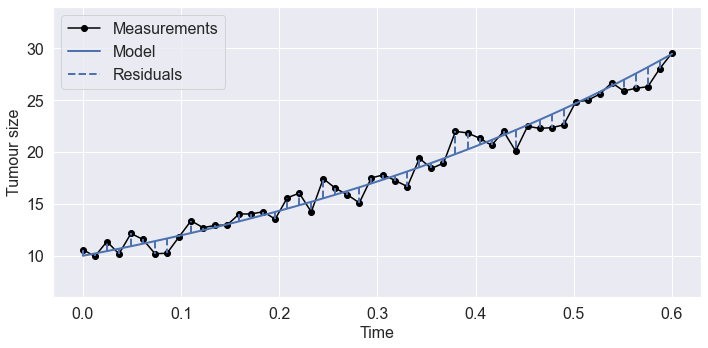

In [81]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Highlight one sample
ax.plot(
    times, measurements[0, 0], color='black', marker='o', linestyle='solid',
    label='Measurements')

# Plot mechanistic model
t = np.linspace(0, 0.6)
sim = mechanistic_model.simulate(
    parameters=[10, 1.8], times=t)
ax.plot(
    t, sim[0], color=sns.color_palette()[0], linestyle='solid',
    label='Model', linewidth=2)

sim = mechanistic_model.simulate(
    parameters=[10, 1.8], times=times)[0]
for tid, time in enumerate(times):
    label = 'Residuals' if tid == 0 else None
    ax.plot(
        [time, time], [sim[tid], measurements[0, 0, tid]], linewidth=2,
        color=sns.color_palette()[0], linestyle='--', label=label)


# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour size', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
# ax.plot(
#     [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
#     label='Measurements')
# ax.set_xlim([-0.025, 0.625])
ax.set_ylim([6, 34])
ax.legend(fontsize=fontsize)
plt.savefig('residuals.pdf', bbox_inches='tight')
plt.tight_layout()

Inference

Using Haario-Bardenet adaptive covariance MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Time m:s
0     1      0          0:00.0
1     2      0.5        0:00.0
2     3      0.333      0:00.0
3     4      0.5        0:00.0
20    21     0.429      0:00.0
40    41     0.415      0:00.0
60    61     0.426      0:00.0
80    81     0.358      0:00.0
100   101    0.337      0:00.0
120   121    0.347      0:00.0
140   141    0.404      0:00.0
160   161    0.435      0:00.0
180   181    0.453      0:00.1
Initial phase completed.
200   201    0.468      0:00.1
220   221    0.457      0:00.1
240   241    0.448      0:00.1
260   261    0.46       0:00.1
280   281    0.445      0:00.1
300   301    0.422      0:00.1
320   321    0.408      0:00.1
340   341    0.393      0:00.1
360   361    0.385      0:00.1
380   381    0.37       0:00.1
400   401    0.369      0:00.1
420   421    0.354      0:00.1
440   441    0.347      0:00.1
460   461    0.336      0:00.1
480   481  

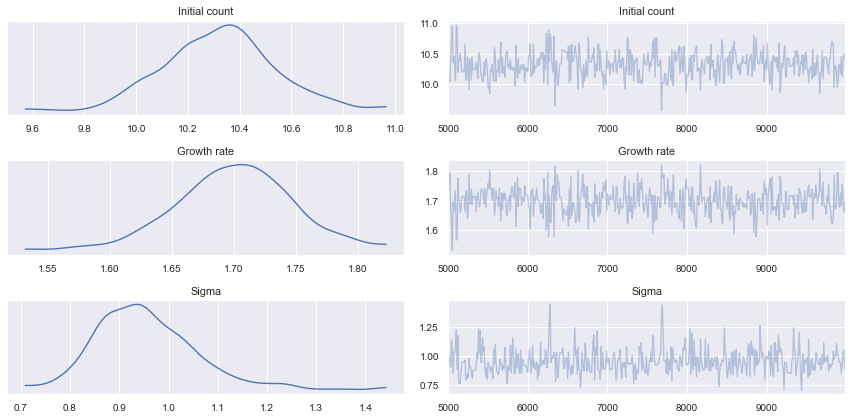

In [8]:
# Format data as dataframe
measurements_df = pd.DataFrame({
    'Observable': 'Count',
    'Value': measurements[0, 0],
    'ID': 1,
    'Time': times
})

# Define log-posterior
log_prior = pints.ComposedLogPrior(
    pints.UniformLogPrior(0, 100),        # Initial condition
    pints.UniformLogPrior(0, 10),         # exponential growth
    pints.UniformLogPrior(0, 10))         # sigma
problem = chi.ProblemModellingController(mechanistic_model, error_model)
problem.set_data(measurements_df)
problem.set_log_prior(log_prior)
log_posterior = problem.get_log_posterior()

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
n_iterations = 10000
posterior_samples_ind = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 5000
thinning = 10
az.plot_trace(
    posterior_samples_ind.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

In [21]:
import matplotlib.animation as animation
import numpy as np
from pylab import *

dpi = 100

y0 = posterior_samples_ind['Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_ind['Growth rate'].sel(draw=slice(500, 1500)).values[0]
def ani_frame():
    # Set up figure
    fig, ax = plt.subplots(
        nrows=1, ncols=1, figsize=(10, 5))

    # Highlight one sample
    ax.plot(
        times, measurements[0, 0], color='black', marker='o', linestyle='solid',
        label='Measurements')

    # Plot mechanistic model
    t = np.linspace(0, 0.6)
    sim = mechanistic_model.simulate(
        parameters=[10, 1.8], times=t)
    ax.plot(
        t, sim[0], color=sns.color_palette()[0], linestyle='solid',
        label='Model', linewidth=2)
    sim = mechanistic_model.simulate(
        parameters=[10, 1.8], times=times)[0]
    for tid, time in enumerate(times):
        label = 'Residuals' if tid == 0 else None
        ax.plot(
            [time, time], [sim[tid], measurements[0, 0, tid]], linewidth=2,
            color=sns.color_palette()[0], linestyle='--', label=label)


    # Legend, ranges axes labels
    fontsize = 16
    ax.set_xlabel('Time', fontsize=fontsize)
    ax.set_ylabel('Tumour size', fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)
    ax.set_ylim([6, 34])
    ax.legend(fontsize=fontsize)

    tight_layout()

    def update_img(n):
        plt.cla()
        # Highlight one sample
        ax.plot(
            times, measurements[0, 0], color='black', marker='o', linestyle='solid',
            label='Measurements')

        # Plot mechanistic model
        t = np.linspace(0, 0.6)
        sim = mechanistic_model.simulate(
            parameters=[y0[5*n], gr[5*n]], times=t)
        ax.plot(
            t, sim[0], color=sns.color_palette()[0], linestyle='solid',
            label='Model', linewidth=2)
        sim = mechanistic_model.simulate(
            parameters=[y0[5*n], gr[5*n]], times=times)[0]
        for tid, time in enumerate(times):
            label = 'Residuals' if tid == 0 else None
            ax.plot(
                [time, time], [sim[tid], measurements[0, 0, tid]], linewidth=2,
                color=sns.color_palette()[0], linestyle='--', label=label)


        # Legend, ranges axes labels
        fontsize = 16
        ax.set_xlabel('Time', fontsize=fontsize)
        ax.set_ylabel('Tumour size', fontsize=fontsize)
        ax.tick_params(labelsize=fontsize)
        ax.set_ylim([6, 34])
        ax.legend(fontsize=fontsize)

        tight_layout()
        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig,update_img, 100, interval=50)
    # writer = animation.writers['ffmpeg'](fps=30)

    ani.save('fit.gif',dpi=dpi)
    return ani

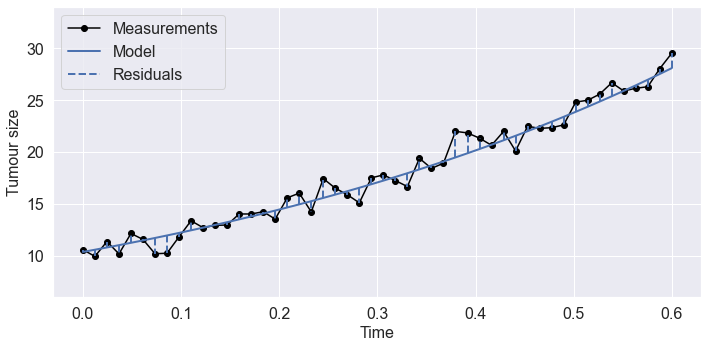

In [22]:
ani_frame()

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/var/folders/8w/b9lb3wb92c1fscyr5tc8nswh0000gp/T/ipykernel_17890/3587504391.py:23: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



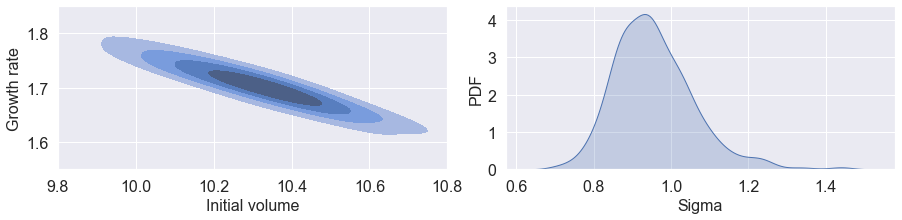

In [45]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 3), gridspec_kw=dict(wspace=0.15))
s = posterior_samples_ind.sel(draw=slice(warmup, n_iterations, thinning))
y0 = s['Initial count'].values[0]
gr = s['Growth rate'].values[0]
sigma = s['Sigma'].values[0]
sns.kdeplot(x=y0, y=gr, ax=axes[0], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1])
sns.kdeplot(sigma, ax=axes[1], fill=True)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Initial volume', fontsize=fontsize)
axes[0].set_ylabel('Growth rate', fontsize=fontsize)
axes[0].set_xlim([9.8, 10.8])
axes[0].set_ylim([1.55, 1.85])
axes[1].set_xlabel('Sigma', fontsize=fontsize)
axes[1].set_ylabel('PDF', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
plt.savefig('posterior_ind.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

Inference across individuals

In [53]:
n_ids = len(measurements)
posteriors = []
for n_id in range(n_ids):
    print(n_id)
    # Format data as dataframe
    measurements_df = pd.DataFrame({
        'Observable': 'Count',
        'Value': measurements[n_id, 0],
        'ID': n_id,
        'Time': times
    })

    # Define log-posterior
    log_prior = pints.ComposedLogPrior(
        pints.UniformLogPrior(0, 100),        # Initial condition
        pints.UniformLogPrior(0, 10),         # exponential growth
        pints.UniformLogPrior(0, 10))         # sigma
    problem = chi.ProblemModellingController(mechanistic_model, error_model)
    problem.set_data(measurements_df)
    problem.set_log_prior(log_prior)
    log_posterior = problem.get_log_posterior()

    # Run inference
    seed = 2
    controller = chi.SamplingController(log_posterior, seed=seed)
    controller.set_n_runs(1)
    controller.set_parallel_evaluation(False)
    n_iterations = 10000
    post_samples = controller.run(
        n_iterations=n_iterations, log_to_screen=False)

    warmup = 5000
    thinning = 10
    posteriors.append(post_samples.sel(draw=slice(warmup, n_iterations, thinning)))


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


/var/folders/8w/b9lb3wb92c1fscyr5tc8nswh0000gp/T/ipykernel_17890/923849966.py:23: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



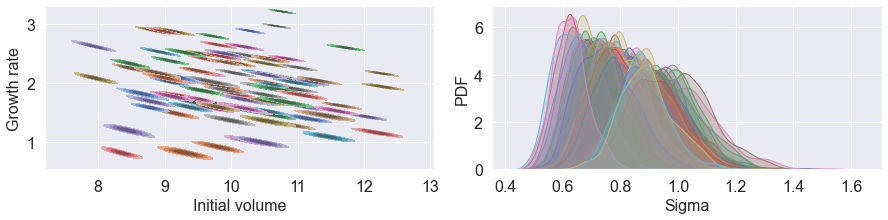

In [55]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 3), gridspec_kw=dict(wspace=0.15))
for s in posteriors:
    y0 = s['Initial count'].values[0]
    gr = s['Growth rate'].values[0]
    sigma = s['Sigma'].values[0]
    sns.kdeplot(x=y0, y=gr, ax=axes[0], fill=True, bw_adjust=1.5,
        levels=[0.2, 0.4, 0.6, 0.8, 1])
    sns.kdeplot(sigma, ax=axes[1], fill=True)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Initial volume', fontsize=fontsize)
axes[0].set_ylabel('Growth rate', fontsize=fontsize)
# axes[0].set_xlim([7.8, 12.2])
# axes[0].set_ylim([0.8, 3.2])
axes[1].set_xlabel('Sigma', fontsize=fontsize)
axes[1].set_ylabel('PDF', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
plt.savefig('posteriors_pop_independent.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

reduce number of measuremnts

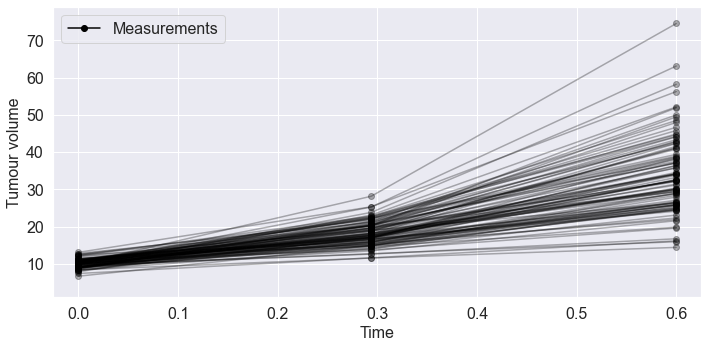

In [56]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    # if idm == 0:
    #     continue
    ax.plot(
        times[[0, 24, 49]], meas[0, [0, 24, 49]], color='black', marker='o',
        linestyle='solid', alpha=0.3)

# # Highlight one sample
# ax.plot(times, measurements[0, 0], color='red', marker='o', linestyle='solid')

# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour volume', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.plot(
    [100, 101], [100, 101], color='black', linestyle='solid', marker='o',
    label='Measurements')
ax.set_xlim([-0.025, 0.625])
ax.set_ylim([1, 79])
ax.legend(fontsize=fontsize)
plt.savefig('fewer_meas.pdf', bbox_inches='tight')
plt.tight_layout()

In [60]:
n_ids = len(measurements)
posteriors_few = []
for n_id in range(n_ids):
    print(n_id)
    # Format data as dataframe
    measurements_df = pd.DataFrame({
        'Observable': 'Count',
        'Value': measurements[n_id, 0, [0, 24, 49]],
        'ID': n_id,
        'Time': times[[0, 24, 49]]
    })

    # Define log-posterior
    log_prior = pints.ComposedLogPrior(
        pints.UniformLogPrior(0, 100),        # Initial condition
        pints.UniformLogPrior(0, 10),         # exponential growth
        pints.UniformLogPrior(0, 10))         # sigma
    problem = chi.ProblemModellingController(mechanistic_model, error_model)
    problem.set_data(measurements_df)
    problem.set_log_prior(log_prior)
    log_posterior = problem.get_log_posterior()

    # Run inference
    seed = 2
    controller = chi.SamplingController(log_posterior, seed=seed)
    controller.set_n_runs(1)
    controller.set_parallel_evaluation(False)
    n_iterations = 10000
    post_samples = controller.run(
        n_iterations=n_iterations, log_to_screen=False)

    warmup = 5000
    thinning = 10
    posteriors_few.append(post_samples.sel(draw=slice(warmup, n_iterations, thinning)))


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


/var/folders/8w/b9lb3wb92c1fscyr5tc8nswh0000gp/T/ipykernel_17890/3160272888.py:23: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



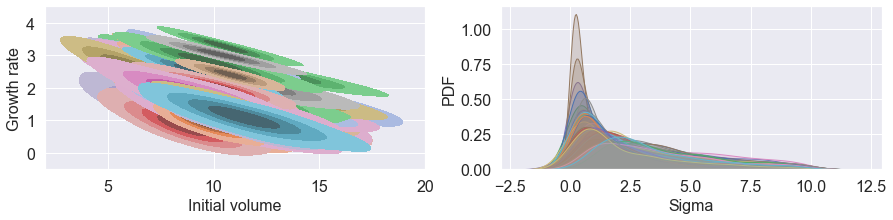

In [64]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=2, figsize=(15, 3), gridspec_kw=dict(wspace=0.2))
for s in posteriors_few:
    y0 = s['Initial count'].values[0]
    gr = s['Growth rate'].values[0]
    sigma = s['Sigma'].values[0]
    sns.kdeplot(x=y0, y=gr, ax=axes[0], fill=True, bw_adjust=1.5,
        levels=[0.2, 0.4, 0.6, 0.8, 1])
    sns.kdeplot(sigma, ax=axes[1], fill=True)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Initial volume', fontsize=fontsize)
axes[0].set_ylabel('Growth rate', fontsize=fontsize)
axes[0].set_xlim([2, 20])
axes[0].set_ylim([-0.5, 4.5])
axes[1].set_xlabel('Sigma', fontsize=fontsize)
axes[1].set_ylabel('PDF', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
plt.savefig('posteriors_pop_independent_few.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

Hierarchical inference animation

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     13     0.5      1        0:00.1
1     14     0.25     1        0:00.1
2     15     0.25     1        0:00.2
3     16     0.5      1        0:00.2


/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:258: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:157: RuntimeWarning:

overflow encountered in exp



20    500    0.842    27       0:05.7
40    3519   0.764    144      0:34.8
60    7147   0.777    173      1:05.9
80    11095  0.77     188      1:47.5
100   14279  0.792    152      2:21.1
120   15447  0.708738 56       2:31.1
140   16899  0.774    70       2:43.7
160   18172  0.715    61       2:54.6
180   19384  0.765    58       3:05.1
200   20676  0.742    62       3:16.9
220   21872  0.766    57       3:27.3
240   22972  0.758    53       3:36.9
260   24032  0.725    51       3:46.0
280   25516  0.764    71       3:58.7
300   26776  0.742    60       4:09.7
320   27844  0.745    51       4:19.0
340   29008  0.765    56       4:29.0
360   30332  0.762    64       4:40.5
380   31496  0.746    56       4:50.4
400   32628  0.782776 54       5:00.2
420   33600  0.754786 47       5:08.6
440   34572  0.747    47       5:17.0
460   35918  0.737    64       5:28.4
480   37178  0.76     60       5:39.1
500   38470  0.771    62       5:50.6
520   39730  0.807    60       6:08.4
540   40990 

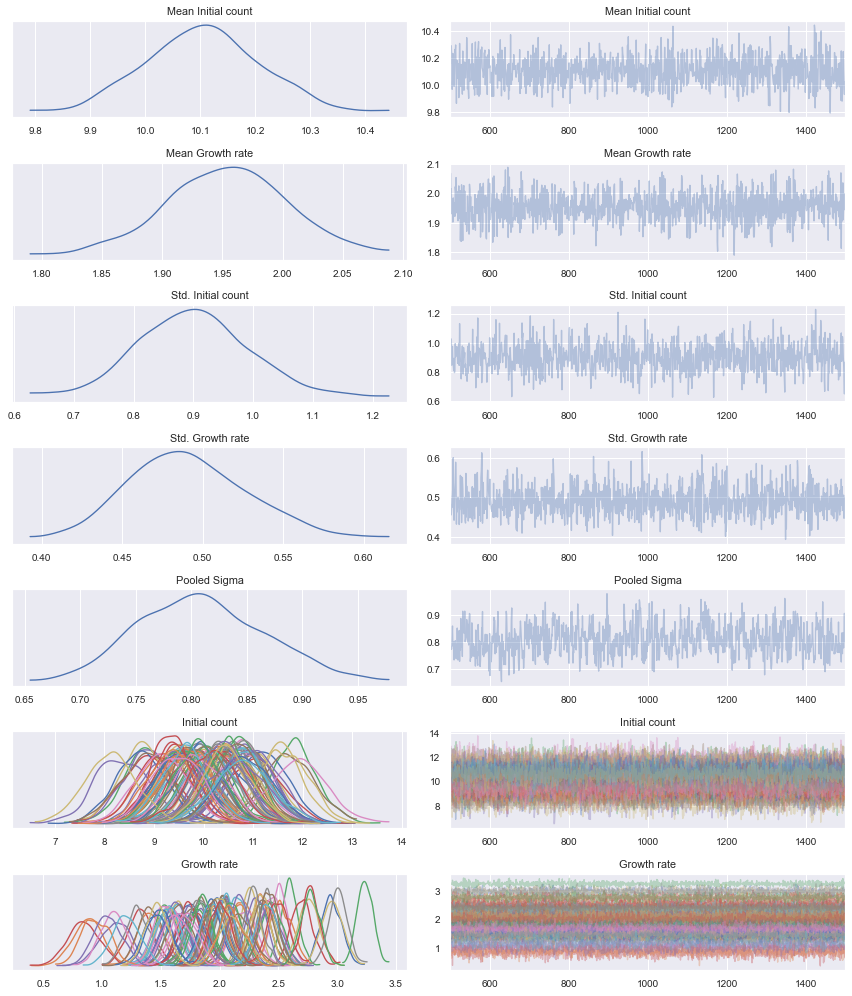

In [66]:
# Format data as dataframe
ids = np.arange(1, n_ids + 1)
n_times = len(times[[0, 24, 49]])
measurements_df = pd.DataFrame({
    'Observable': 'Count',
    'Value': measurements[:, 0, [0, 24, 49]].flatten(),
    'ID': np.broadcast_to(ids[:, np.newaxis], (n_ids, n_times)).flatten(),
    'Time': np.broadcast_to(times[np.newaxis, [0, 24, 49]], (n_ids, n_times)).flatten()
})

# Define hierarchical log-posterior
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel()])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1),      # Std. exponential growth
    pints.GaussianLogPrior(0.8, 0.2))    # Sigma
problem = chi.ProblemModellingController(mechanistic_model, error_model)
problem.set_population_model(population_model)
problem.set_data(measurements_df)
problem.set_log_prior(log_prior)
log_posterior = problem.get_log_posterior()

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_hierarchical = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_hierarchical.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

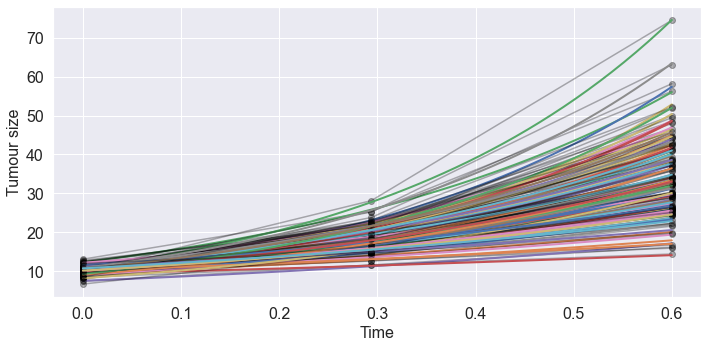

In [72]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Plot measurement used for the inference as reference
y0 = posterior_samples_hierarchical[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_hierarchical[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
for idm, meas in enumerate(measurements):
    # if idm == 0:
    #     continue
    ax.plot(
        times[[0, 24, 49]], meas[0, [0, 24, 49]], color='black', marker='o',
        linestyle='solid', alpha=0.3)

    # Plot mechanistic model
    t = np.linspace(0, 0.6)
    sim = mechanistic_model.simulate(
        parameters=[y0[0, idm], gr[0, idm]], times=t)
    ax.plot(
        t, sim[0], linestyle='solid',
        label='Model', linewidth=2)

# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour size', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
plt.tight_layout()

In [87]:
import matplotlib.animation as animation
import numpy as np
from pylab import *

dpi = 100

y0 = posterior_samples_hierarchical[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_hierarchical[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
def ani_frame():
    # Set up figure
    fig, ax = plt.subplots(
        nrows=1, ncols=1, figsize=(10, 5))

    for idm, meas in enumerate(measurements):
        ax.plot(
            times[[0, 24, 49]], meas[0, [0, 24, 49]], color='black', marker='o',
            linestyle='solid', alpha=0.3)

        # Plot mechanistic model
        t = np.linspace(0, 0.6)
        sim = mechanistic_model.simulate(
            parameters=[y0[0, idm], gr[0, idm]], times=t)
        ax.plot(
            t, sim[0], linestyle='solid',
            label='Model', linewidth=2)

    # Legend, ranges axes labels
    fontsize = 16
    ax.set_xlabel('Time', fontsize=fontsize)
    ax.set_ylabel('Tumour size', fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)
    ax.set_ylim([6, 89])

    tight_layout()

    def update_img(n):
        plt.cla()
        for idm, meas in enumerate(measurements):
            ax.plot(
                times[[0, 24, 49]], meas[0, [0, 24, 49]], color='black', marker='o',
                linestyle='solid', alpha=0.3)

            # Plot mechanistic model
            t = np.linspace(0, 0.6)
            sim = mechanistic_model.simulate(
                parameters=[y0[n, idm], gr[n, idm]], times=t)
            ax.plot(
                t, sim[0], linestyle='solid',
                label='Model', linewidth=2)

        # Legend, ranges axes labels
        fontsize = 16
        ax.set_xlabel('Time', fontsize=fontsize)
        ax.set_ylabel('Tumour size', fontsize=fontsize)
        ax.tick_params(labelsize=fontsize)
        ax.set_ylim([6, 89])

        tight_layout()

        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig,update_img, 100, interval=100)

    ani.save('hierarchical_fit.gif', dpi=dpi)
    return ani

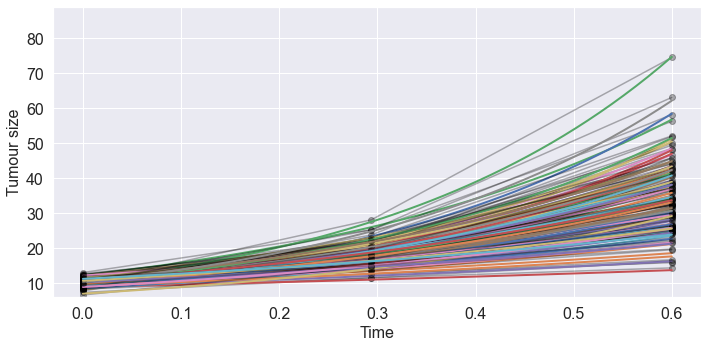

In [88]:
ani_frame()

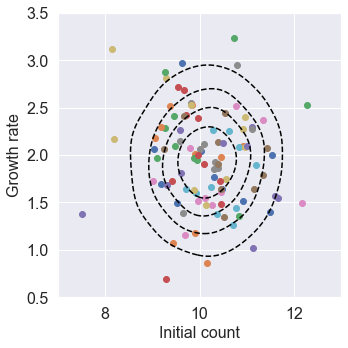

In [81]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Get parameters
y0 = posterior_samples_hierarchical[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_hierarchical[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
mean_y0 = posterior_samples_hierarchical[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_hierarchical[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_hierarchical[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_hierarchical[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]

# Plot data-generating distribution as reference to parameter space
n_samples = 1000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
samples = population_model.sample(
    [mean_y0[0], mean_gr[0], std_y0[0], std_gr[0]], n_samples)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=ax)

# Illustrate samples corresponding to the measurements
for idm in range(n_ids):
    ax.scatter(
        y0[0, idm], gr[0, idm], marker='o')

# Legend, ranges axes labels
fontsize = 16
ax.set_xlim([7, 13])
ax.set_ylim([0.5, 3.5])
ax.set_xlabel('Initial count', fontsize=fontsize)
ax.set_ylabel('Growth rate', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
plt.tight_layout()

In [85]:
import matplotlib.animation as animation
import numpy as np
from pylab import *

dpi = 100

# Get parameters
y0 = posterior_samples_hierarchical[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_hierarchical[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
mean_y0 = posterior_samples_hierarchical[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_hierarchical[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_hierarchical[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_hierarchical[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]

# Plot data-generating distribution as reference to parameter space
n_samples = 1000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
def ani_frame():
    # Set up figure
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))

    samples = population_model.sample(
        [mean_y0[0], mean_gr[0], std_y0[0], std_gr[0]], n_samples)
    sns.kdeplot(
        x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
        color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
        linestyles='solid', ax=ax)

    # Illustrate samples corresponding to the measurements
    for idm in range(n_ids):
        ax.scatter(
            y0[0, idm], gr[0, idm], marker='o')

    # Legend, ranges axes labels
    fontsize = 16
    ax.set_xlim([7, 13])
    ax.set_ylim([0.5, 3.5])
    ax.set_xlabel('Initial count', fontsize=fontsize)
    ax.set_ylabel('Growth rate', fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)

    tight_layout()

    def update_img(n):
        plt.cla()
        samples = population_model.sample(
            [mean_y0[n], mean_gr[n], std_y0[n], std_gr[n]], n_samples)
        sns.kdeplot(
            x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
            color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
            linestyles='solid', ax=ax)

        # Illustrate samples corresponding to the measurements
        for idm in range(n_ids):
            ax.scatter(
                y0[n, idm], gr[n, idm], marker='o')

        # Legend, ranges axes labels
        fontsize = 16
        ax.set_xlim([7, 13])
        ax.set_ylim([0.5, 3.5])
        ax.set_xlabel('Initial count', fontsize=fontsize)
        ax.set_ylabel('Growth rate', fontsize=fontsize)
        ax.tick_params(labelsize=fontsize)

        tight_layout()

        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig, update_img, 100, interval=100)

    ani.save('hierarchical_pop_fit.gif', dpi=dpi)
    return ani

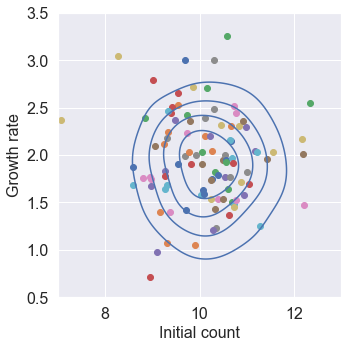

In [86]:
ani_frame()

/var/folders/8w/b9lb3wb92c1fscyr5tc8nswh0000gp/T/ipykernel_17890/2776304837.py:48: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



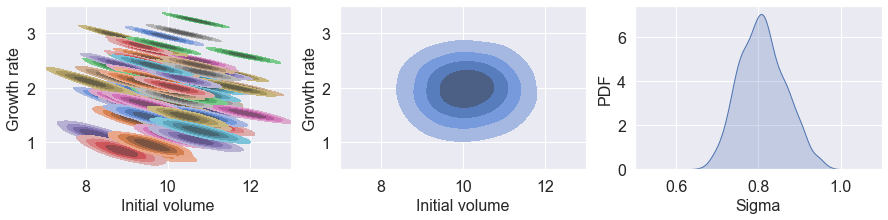

In [101]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(15, 3), gridspec_kw=dict(wspace=0.2))
mean_y0 = posterior_samples_hierarchical[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_hierarchical[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_hierarchical[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_hierarchical[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]
y0 = posterior_samples_hierarchical[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_hierarchical[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
n_samples = 10000
samples = np.empty(shape=(n_samples, 2))
for ids in range(n_samples):
    samples[ids] = population_model.sample([
        mean_y0[ids % 1000], mean_gr[ids % 1000], std_y0[ids % 1000],
        std_gr[ids % 1000]])[0]
    if ids < 100:
        sns.kdeplot(x=y0[:, ids], y=gr[:, ids], ax=axes[0], fill=True,
            bw_adjust=1.5, levels=[0.2, 0.4, 0.6, 0.8, 1])
sns.kdeplot(x=samples[:, 0], y=samples[:, 1], ax=axes[1], fill=True,
    bw_adjust=1.5, levels=[0.2, 0.4, 0.6, 0.8, 1])
sigma = posterior_samples_hierarchical[
    'Pooled Sigma'].sel(draw=slice(500, 1500)).values[0]
sns.kdeplot(sigma, ax=axes[2], fill=True)

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Initial volume', fontsize=fontsize)
axes[0].set_ylabel('Growth rate', fontsize=fontsize)
axes[0].set_xlim([7, 13])
axes[0].set_ylim([0.5, 3.5])
axes[1].set_xlim([7, 13])
axes[1].set_ylim([0.5, 3.5])
axes[1].set_xlabel('Initial volume', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[2].set_xlabel('Sigma', fontsize=fontsize)
axes[2].set_ylabel('PDF', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[2].tick_params(labelsize=fontsize)
axes[2].set_xlim([0.5, 1.1])
plt.savefig('nlme_inference.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

/var/folders/8w/b9lb3wb92c1fscyr5tc8nswh0000gp/T/ipykernel_17890/2975108109.py:56: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



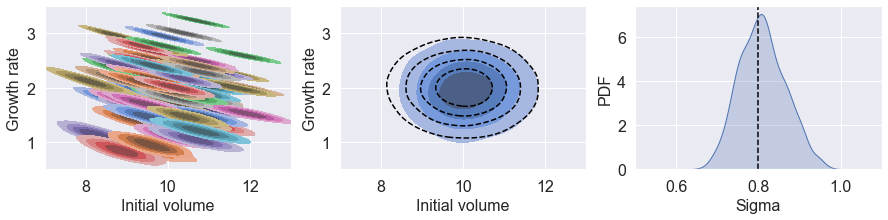

In [103]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(15, 3), gridspec_kw=dict(wspace=0.2))
mean_y0 = posterior_samples_hierarchical[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_hierarchical[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_hierarchical[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_hierarchical[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]
y0 = posterior_samples_hierarchical[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_hierarchical[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
n_samples = 10000
samples = np.empty(shape=(n_samples, 2))
for ids in range(n_samples):
    samples[ids] = population_model.sample([
        mean_y0[ids % 1000], mean_gr[ids % 1000], std_y0[ids % 1000],
        std_gr[ids % 1000]])[0]
    if ids < 100:
        sns.kdeplot(x=y0[:, ids], y=gr[:, ids], ax=axes[0], fill=True,
            bw_adjust=1.5, levels=[0.2, 0.4, 0.6, 0.8, 1])
sns.kdeplot(x=samples[:, 0], y=samples[:, 1], ax=axes[1], fill=True,
    bw_adjust=1.5, levels=[0.2, 0.4, 0.6, 0.8, 1])
sigma = posterior_samples_hierarchical[
    'Pooled Sigma'].sel(draw=slice(500, 1500)).values[0]
sns.kdeplot(sigma, ax=axes[2], fill=True)

# Plot reference
n_samples = 50000
samples = population_model.sample(population_parameters[:-1], n_samples)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])
axes[2].axvline(population_parameters[-1], color='black', linestyle='--')

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Initial volume', fontsize=fontsize)
axes[0].set_ylabel('Growth rate', fontsize=fontsize)
axes[0].set_xlim([7, 13])
axes[0].set_ylim([0.5, 3.5])
axes[1].set_xlim([7, 13])
axes[1].set_ylim([0.5, 3.5])
axes[1].set_xlabel('Initial volume', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[2].set_xlabel('Sigma', fontsize=fontsize)
axes[2].set_ylabel('PDF', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[2].tick_params(labelsize=fontsize)
axes[2].set_xlim([0.5, 1.1])
plt.savefig('nlme_inference_with_reference.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

Snapshot measurements

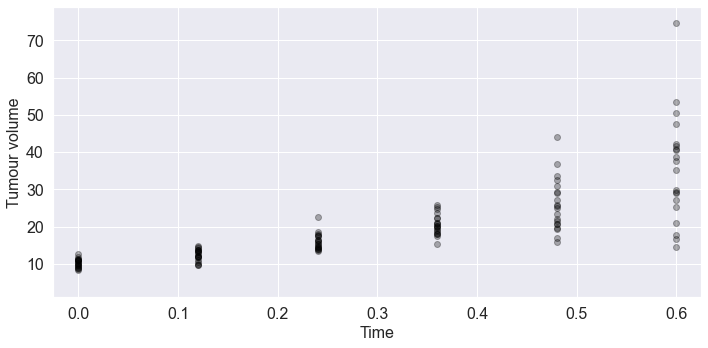

In [108]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 20
n_times = len(times)
n_observables = 1
measurements = np.empty(shape=(n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:, 0, idt] = dense_measurements[0, idt, start_ids:end_ids]

# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Plot measurement used for the inference as reference
for idm, meas in enumerate(measurements):
    # if idm == 0:
    #     continue
    ax.scatter(
        times, meas[0], color='black', marker='o', alpha=0.3)

# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour volume', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
ax.set_xlim([-0.025, 0.625])
ax.set_ylim([1, 79])
plt.savefig('snapshot_measurements.pdf', bbox_inches='tight')
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     11     0.5      1        0:00.1
1     12     0.25     1        0:00.1
2     13     0.25     1        0:00.1
3     14     0.5      1        0:00.1


/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:258: RuntimeWarning:

overflow encountered in exp

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/pints/_mcmc/_nuts.py:157: RuntimeWarning:

overflow encountered in exp



20    9117   0.792    506      1:31.9
40    26001  0.775    804      4:08.3
60    41868  0.739    756      6:38.5
80    56247  0.777    685      8:57.9
100   72726  0.785    785     11:32.6
120   75604  0.705    138     12:01.0
140   78020  0.773    116     12:24.9
160   80027  0.725    96      12:44.8
180   82324  0.77     110     13:06.8
200   85336  0.728    144     13:33.9
220   87684  0.77     112     13:55.4
240   90032  0.757    112     14:22.5
260   92273  0.73     107     14:45.4
280   96036  0.766    180     15:21.2
300   97675  0.732    79      15:36.7
320   99368  0.738    81      15:53.6
340   101364  0.784    96      16:13.9
360   104160  0.738    134     16:41.3
380   106124  0.763    94      17:00.4
400   107974  0.772    89      17:19.0
420   110202  0.751    107     17:39.4
440   111846  0.756    79      17:54.5
460   113796  0.728    93      18:13.2
480   116368  0.759    123     18:37.3
500   117719  0.775    65      18:50.3
520   119171  0.771    70      19:06.0
54

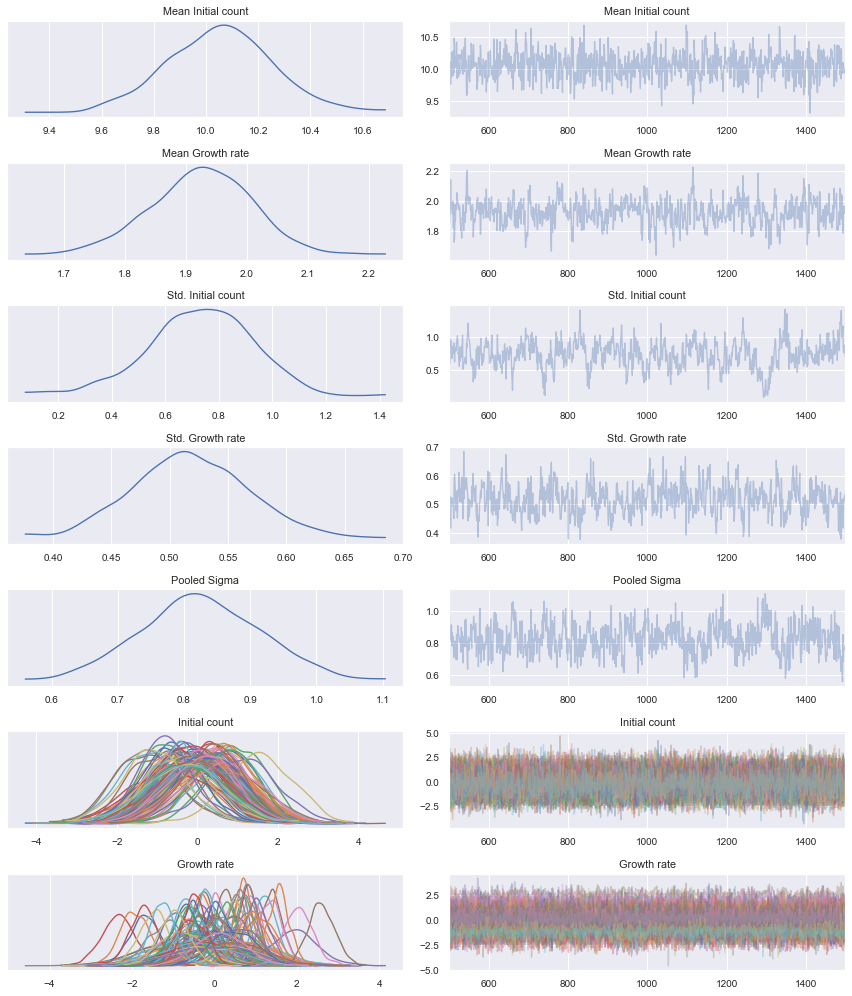

In [110]:
# Format data as dataframe
n_times = len(times)
measurements_df = pd.DataFrame({
    'Observable': 'Count',
    'Value': measurements.flatten(),
    'ID': np.arange(1, len(measurements.flatten()) + 1),
    'Time': np.broadcast_to(times[np.newaxis, :], (n_ids, n_times)).flatten()
})

# Define hierarchical log-posterior
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=False),
    chi.PooledModel(dim_names=['Sigma'])])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1),      # Std. exponential growth
    pints.GaussianLogPrior(0.8, 0.1))    # Sigma
problem = chi.ProblemModellingController(mechanistic_model, error_model)
problem.set_population_model(population_model)
problem.set_data(measurements_df)
problem.set_log_prior(log_prior)
log_posterior = problem.get_log_posterior()

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_hierarchical = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_hierarchical.sel(
        draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

/var/folders/8w/b9lb3wb92c1fscyr5tc8nswh0000gp/T/ipykernel_17890/1796607599.py:60: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



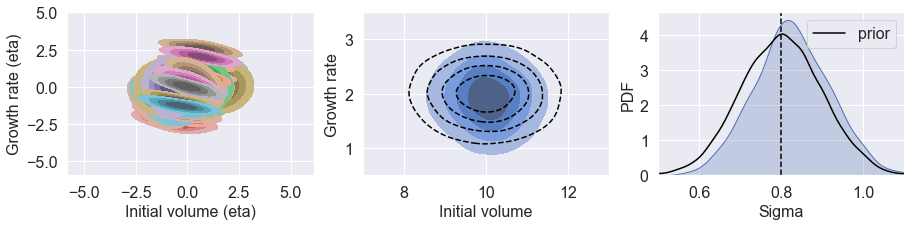

In [120]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(15, 3), gridspec_kw=dict(wspace=0.2))
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
mean_y0 = posterior_samples_hierarchical[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_hierarchical[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_hierarchical[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_hierarchical[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]
y0 = posterior_samples_hierarchical[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_hierarchical[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
n_samples = 10000
samples = np.empty(shape=(n_samples, 2))
for ids in range(n_samples):
    samples[ids] = population_model.sample([
        mean_y0[ids % 1000], mean_gr[ids % 1000], std_y0[ids % 1000],
        std_gr[ids % 1000]])[0]
    if ids < 120:
        sns.kdeplot(x=y0[:, ids], y=gr[:, ids], ax=axes[0], fill=True,
            bw_adjust=1.5, levels=[0.2, 0.4, 0.6, 0.8, 1])
sns.kdeplot(x=samples[:, 0], y=samples[:, 1], ax=axes[1], fill=True,
    bw_adjust=1.5, levels=[0.2, 0.4, 0.6, 0.8, 1])
sigma = posterior_samples_hierarchical[
    'Pooled Sigma'].sel(draw=slice(500, 1500)).values[0]
sns.kdeplot(sigma, ax=axes[2], fill=True)
sns.kdeplot(
    log_prior.sample(n_samples)[:, -1], ax=axes[2], fill=False,
    linestyle='solid', color='black', label='prior')

# Plot reference
n_samples = 50000
samples = population_model.sample(population_parameters[:-1], n_samples)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes[1])
axes[2].axvline(population_parameters[-1], color='black', linestyle='--')

# Legend, ranges axes labels
fontsize = 16
axes[0].set_xlabel('Initial volume (eta)', fontsize=fontsize)
axes[0].set_ylabel('Growth rate (eta)', fontsize=fontsize)
axes[1].set_xlim([7, 13])
axes[1].set_ylim([0.5, 3.5])
axes[1].set_xlabel('Initial volume', fontsize=fontsize)
axes[1].set_ylabel('Growth rate', fontsize=fontsize)
axes[2].set_xlabel('Sigma', fontsize=fontsize)
axes[2].set_ylabel('PDF', fontsize=fontsize)
axes[0].tick_params(labelsize=fontsize)
axes[1].tick_params(labelsize=fontsize)
axes[2].tick_params(labelsize=fontsize)
axes[2].set_xlim([0.5, 1.1])
axes[2].legend(fontsize=fontsize)
plt.savefig('nlme_inference_snapshot.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

PFI visualisation

In [128]:
posterior_samples_filter

<xarray.Dataset>
Dimensions:               (chain: 1, draw: 1500, individual: 100)
Coordinates:
  * chain                 (chain) int64 0
  * draw                  (draw) int64 0 1 2 3 4 5 ... 1495 1496 1497 1498 1499
  * individual            (individual) <U8 'Sim. 1' 'Sim. 2' ... 'Sim. 100'
Data variables:
    Mean Initial count    (chain, draw) float64 10.5 10.63 10.34 ... 9.879 9.896
    Mean Growth rate      (chain, draw) float64 -1.18 -1.479 ... 2.004 2.028
    Std. Initial count    (chain, draw) float64 0.8221 0.8263 ... 0.9498 1.004
    Std. Growth rate      (chain, draw) float64 6.052 5.556 ... 0.4884 0.4901
    Initial count         (chain, draw, individual) float64 9.321 ... 11.62
    Growth rate           (chain, draw, individual) float64 2.302 ... 2.572
    Count Epsilon time 1  (chain, draw, individual) float64 -2.393 ... 0.531
    Count Epsilon time 2  (chain, draw, individual) float64 0.1666 ... 1.227
    Count Epsilon time 3  (chain, draw, individual) float64 -0.0961 ... 1.203
    Count Epsilon time 4  (chain, draw, individual) float64 -0.02193 ... -0.0...
    Count Epsilon time 5  (chain, draw, individual) float64 1.563 ... 0.1412
    Count Epsilon time 6  (chain, draw, individual) float64 -0.6654 ... 0.5935
Attributes:
    divergent iterations:          true
    divergent iterations chain 0:  [  6  22  28  36  40  42  52  55  58  78  ...

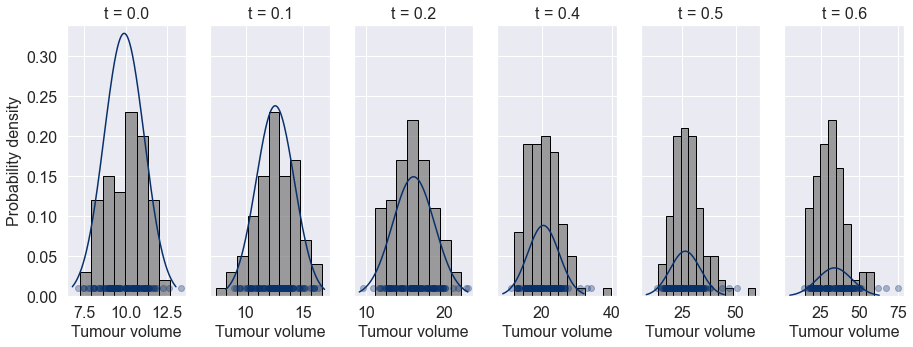

In [156]:
from scipy.stats import norm

# Sample virtual measurements
seed = 6
n_ids = 100
epsilons = np.empty(shape=(6, 1000, 100))
names = [
    'Count Epsilon time 1',
    'Count Epsilon time 2',
    'Count Epsilon time 3',
    'Count Epsilon time 4',
    'Count Epsilon time 5',
    'Count Epsilon time 6']
for idn, n in enumerate(names):
    epsilons[idn] = posterior_samples_filter[n].sel(draw=slice(500, 1500))

# Solve ODEs
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
sigma = population_parameters[-1]
sim = np.empty(shape=(6, n_ids))
for idn in range(n_ids):
    sim[:, idn] = mechanistic_model.simulate(
        parameters=[y0[0, idn], gr[0, idn]], times=times)
sim += sigma * epsilons[:, 0]

# Visualise distributions over time
fontsize = '16'
fig, axes = plt.subplots(
    1, len(times), figsize=(15, 5), sharey='row')
axes[0].set_ylabel('Probability density', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[tid].set_xlabel('Tumour volume', fontsize=fontsize)
    axes[tid].tick_params(labelsize=fontsize)

    # Plot hist over measurements plot
    sns.histplot(
        x=measurements[:, 0, tid], fill=True, linewidth=1, ax=axes[tid],
        legend=False, color='grey', stat='probability', edgecolor='black')

# Plot virtual measurements
for tid in range(len(times)):
    axes[tid].scatter(
        x=sim[tid], y=[0.01] * n_ids,
        color=plt.get_cmap('Blues_r')(0), alpha=0.3)

# Visualise population filters
mu = np.mean(sim, axis=1)
sigma = np.std(sim, axis=1, ddof=1)
for tid in range(len(times)):
    start = norm(mu[tid], sigma[tid]).ppf(0.005)
    stop = norm(mu[tid], sigma[tid]).ppf(0.995)
    xs = np.linspace(start, stop, 200)
    pdf = norm(mu[tid], sigma[tid]).pdf(xs)
    axes[tid].plot(xs, pdf, color=plt.get_cmap('Blues_r')(0))

# Add legend
axes[0].set_ylim([0, 0.34])
axes[-1].plot([25, 25], [1, 1], color='black', label='Measurements')
axes[-1].scatter([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Virtual measurements')
axes[-1].plot([25, 25], [1, 1], color=plt.get_cmap('Blues_r')(0), label='Population filter')
plt.show()

In [176]:
import matplotlib.animation as animation
import numpy as np
from pylab import *
from scipy.stats import norm

dpi = 100

n_ids = 100
epsilons = np.empty(shape=(6, 1000, 100))
names = [
    'Count Epsilon time 1',
    'Count Epsilon time 2',
    'Count Epsilon time 3',
    'Count Epsilon time 4',
    'Count Epsilon time 5',
    'Count Epsilon time 6']
for idn, n in enumerate(names):
    epsilons[idn] = posterior_samples_filter[n].sel(draw=slice(500, 1500))

ax_ranges = [
    [7.1, 12.9],
    [6, 19],
    [8, 25],
    [10, 40],
    [10, 60],
    [10, 75]
]

# Solve ODEs
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
def ani_frame():
    # Set up figure
    sim = np.empty(shape=(6, n_ids))
    for idn in range(n_ids):
        sim[:, idn] = mechanistic_model.simulate(
            parameters=[y0[0, idn], gr[0, idn]], times=times)
    sim += population_parameters[-1] * epsilons[:, 0]

    # Visualise distributions over time
    fontsize = '16'
    fig, axes = plt.subplots(
        1, len(times), figsize=(15, 5), sharey='row')
    axes[0].set_ylabel('Probability density', fontsize=fontsize)
    for tid, time in enumerate(times):
        # Add title and x-label to subfigure
        axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
        axes[tid].set_xlabel('Tumour volume', fontsize=fontsize)
        axes[tid].tick_params(labelsize=fontsize)

        # Plot hist over measurements plot
        sns.histplot(
            x=measurements[:, 0, tid], fill=True, linewidth=1, ax=axes[tid],
            legend=False, color='grey', stat='probability', edgecolor='black')

    # Plot virtual measurements
    for tid in range(len(times)):
        axes[tid].scatter(
            x=sim[tid], y=[0.01] * n_ids,
            color=plt.get_cmap('Blues_r')(0), alpha=0.3)

    # Visualise population filters
    mu = np.mean(sim, axis=1)
    sigma = np.std(sim, axis=1, ddof=1)
    for tid in range(len(times)):
        start = norm(mu[tid], sigma[tid]).ppf(0.005)
        stop = norm(mu[tid], sigma[tid]).ppf(0.995)
        xs = np.linspace(start, stop, 200)
        pdf = norm(mu[tid], sigma[tid]).pdf(xs)
        axes[tid].plot(xs, pdf, color=plt.get_cmap('Blues_r')(0))

    axes[0].set_ylim([0, 0.35])
    for ida, ax in enumerate(axes):
        ax.set_xlim(ax_ranges[ida])

    tight_layout()

    def update_img(n):
        for ax in axes:
            ax.clear()
        sim = np.empty(shape=(6, n_ids))
        for idn in range(n_ids):
            sim[:, idn] = mechanistic_model.simulate(
                parameters=[y0[n, idn], gr[n, idn]], times=times)
        sim += population_parameters[-1] * epsilons[:, n]

        # Visualise distributions over time
        fontsize = '16'
        axes[0].set_ylabel('Probability density', fontsize=fontsize)
        for tid, time in enumerate(times):
            # Add title and x-label to subfigure
            axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
            axes[tid].set_xlabel('Tumour volume', fontsize=fontsize)
            axes[tid].tick_params(labelsize=fontsize)

            # Plot hist over measurements plot
            sns.histplot(
                x=measurements[:, 0, tid], fill=True, linewidth=1, ax=axes[tid],
                legend=False, color='grey', stat='probability', edgecolor='black')

        # Plot virtual measurements
        for tid in range(len(times)):
            axes[tid].scatter(
                x=sim[tid], y=[0.01] * n_ids,
                color=plt.get_cmap('Blues_r')(0), alpha=0.3)

        # Visualise population filters
        mu = np.mean(sim, axis=1)
        sigma = np.std(sim, axis=1, ddof=1)
        for tid in range(len(times)):
            start = norm(mu[tid], sigma[tid]).ppf(0.005)
            stop = norm(mu[tid], sigma[tid]).ppf(0.995)
            xs = np.linspace(start, stop, 200)
            pdf = norm(mu[tid], sigma[tid]).pdf(xs)
            axes[tid].plot(xs, pdf, color=plt.get_cmap('Blues_r')(0))

        axes[0].set_ylim([0, 0.35])
        for ida, ax in enumerate(axes):
            ax.set_xlim(ax_ranges[ida])

        tight_layout()

        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig,update_img, 100, interval=100)

    ani.save('pfi_population_filters.gif', dpi=dpi)
    return ani

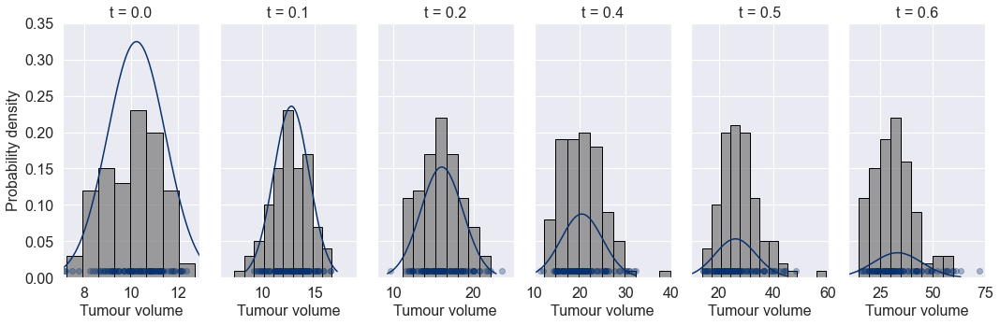

In [177]:
ani_frame()

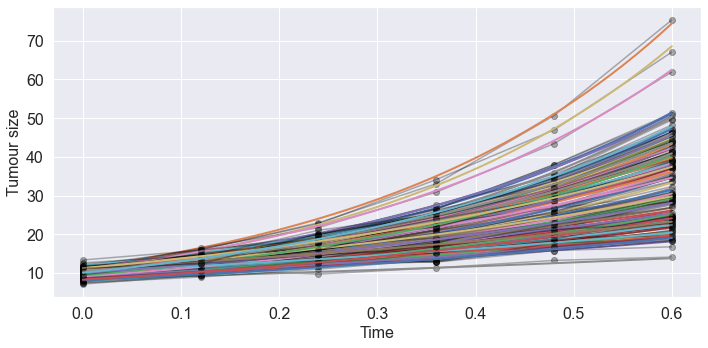

In [179]:
# Set up figure
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(10, 5))

# Plot measurement used for the inference as reference
epsilons = np.empty(shape=(6, 1000, 100))
names = [
    'Count Epsilon time 1',
    'Count Epsilon time 2',
    'Count Epsilon time 3',
    'Count Epsilon time 4',
    'Count Epsilon time 5',
    'Count Epsilon time 6']
for idn, n in enumerate(names):
    epsilons[idn] = posterior_samples_filter[n].sel(draw=slice(500, 1500))

# Solve ODEs
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
sim = np.empty(shape=(6, n_ids))
for idn in range(n_ids):
    sim[:, idn] = mechanistic_model.simulate(
        parameters=[y0[0, idn], gr[0, idn]], times=times)
meass = sim + population_parameters[-1] * epsilons[:, 0]

for idm, meas in enumerate(meass.T):
    # if idm == 0:
    #     continue
    ax.plot(
        times, meas, color='black', marker='o',
        linestyle='solid', alpha=0.3)

    # Plot mechanistic model
    t = np.linspace(0, 0.6)
    sim = mechanistic_model.simulate(
        parameters=[y0[0, idm], gr[0, idm]], times=t)
    ax.plot(
        t, sim[0], linestyle='solid',
        label='Model', linewidth=2)

# Legend, ranges axes labels
fontsize = 16
ax.set_xlabel('Time', fontsize=fontsize)
ax.set_ylabel('Tumour size', fontsize=fontsize)
ax.tick_params(labelsize=fontsize)
plt.tight_layout()

In [182]:
import matplotlib.animation as animation
import numpy as np
from pylab import *
from scipy.stats import norm

dpi = 100

n_ids = 100
epsilons = np.empty(shape=(6, 1000, 100))
names = [
    'Count Epsilon time 1',
    'Count Epsilon time 2',
    'Count Epsilon time 3',
    'Count Epsilon time 4',
    'Count Epsilon time 5',
    'Count Epsilon time 6']
for idn, n in enumerate(names):
    epsilons[idn] = posterior_samples_filter[n].sel(draw=slice(500, 1500))

# Solve ODEs
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
def ani_frame():
    # Set up figure
    fig, ax = plt.subplots(
        nrows=1, ncols=1, figsize=(10, 5))
    sim = np.empty(shape=(6, n_ids))
    for idn in range(n_ids):
        sim[:, idn] = mechanistic_model.simulate(
            parameters=[y0[0, idn], gr[0, idn]], times=times)
    meass = sim + population_parameters[-1] * epsilons[:, 0]

    for idm, meas in enumerate(meass.T):
        # if idm == 0:
        #     continue
        ax.plot(
            times, meas, color='black', marker='o',
            linestyle='solid', alpha=0.3)

        # Plot mechanistic model
        t = np.linspace(0, 0.6)
        sim = mechanistic_model.simulate(
            parameters=[y0[0, idm], gr[0, idm]], times=t)
        ax.plot(
            t, sim[0], linestyle='solid',
            label='Model', linewidth=2)

    # Legend, ranges axes labels
    fontsize = 16
    ax.set_xlabel('Time', fontsize=fontsize)
    ax.set_ylabel('Tumour size', fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)
    ax.set_ylim([5, 79])

    tight_layout()

    def update_img(n):
        plt.cla()
        sim = np.empty(shape=(6, n_ids))
        for idn in range(n_ids):
            sim[:, idn] = mechanistic_model.simulate(
                parameters=[y0[n, idn], gr[n, idn]], times=times)
        meass = sim + population_parameters[-1] * epsilons[:, n]

        for idm, meas in enumerate(meass.T):
            # if idm == 0:
            #     continue
            ax.plot(
                times, meas, color='black', marker='o',
                linestyle='solid', alpha=0.3)

            # Plot mechanistic model
            t = np.linspace(0, 0.6)
            sim = mechanistic_model.simulate(
                parameters=[y0[n, idm], gr[n, idm]], times=t)
            ax.plot(
                t, sim[0], linestyle='solid',
                label='Model', linewidth=2)

        # Legend, ranges axes labels
        fontsize = 16
        ax.set_xlabel('Time', fontsize=fontsize)
        ax.set_ylabel('Tumour size', fontsize=fontsize)
        ax.tick_params(labelsize=fontsize)
        ax.set_ylim([5, 79])

        tight_layout()

        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig,update_img, 100, interval=100)

    ani.save('pfi_hierarchical_fit.gif', dpi=dpi)
    return ani

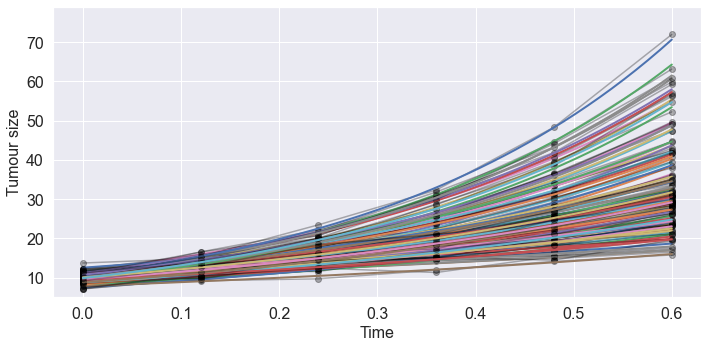

In [183]:
ani_frame()

In [184]:
import matplotlib.animation as animation
import numpy as np
from pylab import *

dpi = 100

# Get parameters
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
mean_y0 = posterior_samples_filter[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_filter[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_filter[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_filter[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]

# Plot data-generating distribution as reference to parameter space
n_samples = 1000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
def ani_frame():
    # Set up figure
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))

    samples = population_model.sample(
        [mean_y0[0], mean_gr[0], std_y0[0], std_gr[0]], n_samples)
    sns.kdeplot(
        x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
        color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
        linestyles='solid', ax=ax)

    # Illustrate samples corresponding to the measurements
    for idm in range(n_ids):
        ax.scatter(
            y0[0, idm], gr[0, idm], marker='o')

    # Legend, ranges axes labels
    fontsize = 16
    ax.set_xlim([7, 13])
    ax.set_ylim([0.5, 3.5])
    ax.set_xlabel('Initial count', fontsize=fontsize)
    ax.set_ylabel('Growth rate', fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)

    tight_layout()

    def update_img(n):
        plt.cla()
        samples = population_model.sample(
            [mean_y0[n], mean_gr[n], std_y0[n], std_gr[n]], n_samples)
        sns.kdeplot(
            x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
            color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
            linestyles='solid', ax=ax)

        # Illustrate samples corresponding to the measurements
        for idm in range(n_ids):
            ax.scatter(
                y0[n, idm], gr[n, idm], marker='o')

        # Legend, ranges axes labels
        fontsize = 16
        ax.set_xlim([7, 13])
        ax.set_ylim([0.5, 3.5])
        ax.set_xlabel('Initial count', fontsize=fontsize)
        ax.set_ylabel('Growth rate', fontsize=fontsize)
        ax.tick_params(labelsize=fontsize)

        tight_layout()

        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig, update_img, 100, interval=100)

    ani.save('pfi_pop_fit.gif', dpi=dpi)
    return ani

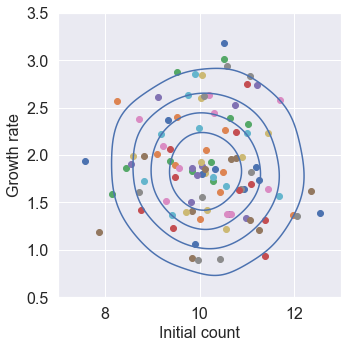

In [185]:
ani_frame()

Information loss (n_samples)

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     7      0.25     2        0:00.0
1     8      0.25     1        0:00.0
2     11     0.125    2        0:00.0
3     74     0.492    32       0:00.1
20    2249   0.748    121      0:01.9
40    4723   0.749    118      0:04.0
60    6950   0.764    107      0:06.2
80    8535   0.747    76       0:07.5
100   10830  0.771    110      0:09.3
120   12159  0.713216 64       0:10.3
140   13531  0.757299 66       0:11.1
160   14298  0.709    37       0:11.5
180   15537  0.756787 59       0:12.2
200   16641  0.744    53       0:12.9
220   17624  0.774    47       0:13.4
240   18572  0.749    46       0:14.0
260   19411  0.705    40       0:14.6
280   20804  0.772    67       0:15.6
300   21859  0.756    51       0:16.3
320   22636  0.749    37       0:16.9
340   23704  0.763    51       0:17.7
360   24596  0.754    43       0:18.7
380   25536  0.757    45       0:19.7
400   26294  0.769

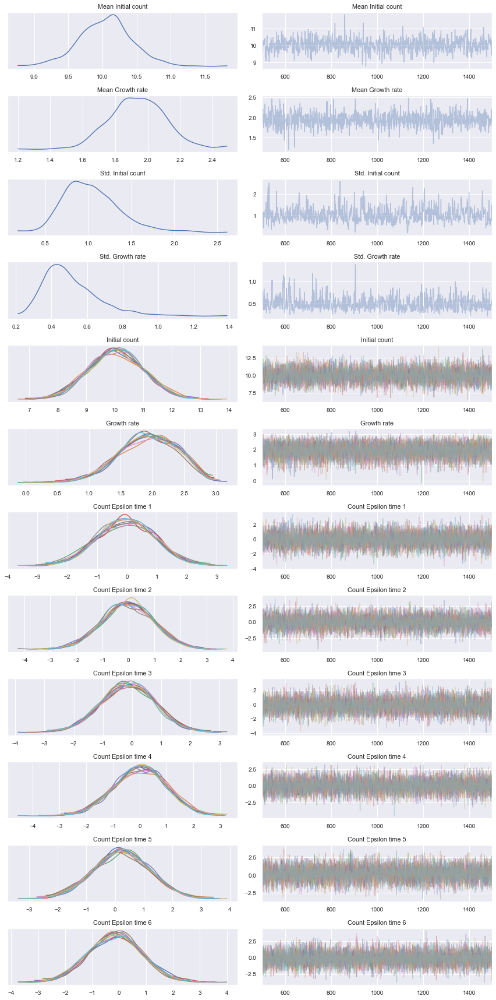

In [186]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1))      # Std. exponential growth
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1], n_samples=10)

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

In [192]:
import matplotlib.animation as animation
import numpy as np
from pylab import *

dpi = 100

# Get parameters
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
mean_y0 = posterior_samples_filter[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_filter[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_filter[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_filter[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]

# Plot data-generating distribution as reference to parameter space
n_samples = 1000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
def ani_frame():
    # Set up figure
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))

    samples = population_model.sample(
        [mean_y0[0], mean_gr[0], std_y0[0], std_gr[0]], n_samples)
    sns.kdeplot(
        x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
        color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
        linestyles='solid', ax=ax)

    # Illustrate samples corresponding to the measurements
    for idm in range(10):
        ax.scatter(
            y0[0, idm], gr[0, idm], marker='o')

    # Legend, ranges axes labels
    fontsize = 16
    ax.set_xlim([7, 13])
    ax.set_ylim([0.5, 3.5])
    ax.set_xlabel('Initial count', fontsize=fontsize)
    ax.set_ylabel('Growth rate', fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)

    tight_layout()

    def update_img(n):
        plt.cla()
        samples = population_model.sample(
            [mean_y0[n], mean_gr[n], std_y0[n], std_gr[n]], n_samples)
        sns.kdeplot(
            x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
            color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
            linestyles='solid', ax=ax)

        # Illustrate samples corresponding to the measurements
        for idm in range(10):
            ax.scatter(
                y0[n, idm], gr[n, idm], marker='o')

        # Legend, ranges axes labels
        fontsize = 16
        ax.set_xlim([7, 13])
        ax.set_ylim([0.5, 3.5])
        ax.set_xlabel('Initial count', fontsize=fontsize)
        ax.set_ylabel('Growth rate', fontsize=fontsize)
        ax.tick_params(labelsize=fontsize)

        tight_layout()

        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig, update_img, 100, interval=100)

    ani.save('pfi_pop_fit_10_samples.gif', dpi=dpi)
    return ani

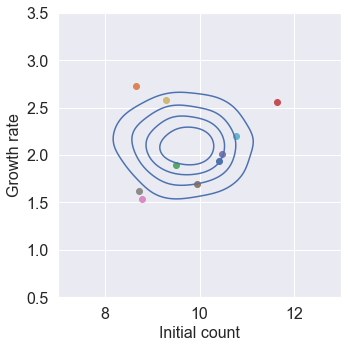

In [193]:
ani_frame()

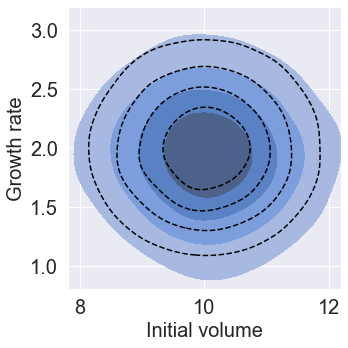

In [196]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_filter.sel(
    draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 2))
population_model = chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=True)
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes)

# Legend, ranges axes labels
fontsize = 20
axes.plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes.plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes.set_xlim([7.8, 12.2])
axes.set_ylim([0.8, 3.2])
axes.set_xlabel('Initial volume', fontsize=fontsize)
axes.set_ylabel('Growth rate', fontsize=fontsize)
axes.tick_params(labelsize=fontsize)

plt.savefig(
    'pfi_10_samples.pdf',
    bbox_inches='tight')
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     7      0.125    2        0:00.0
1     8      0.25     1        0:00.0
2     9      0.25     1        0:00.0
3     16     0.25     4        0:00.0
20    2823   0.771    156      0:01.4
40    5329   0.754    120      0:03.8
60    8551   0.744    154      0:05.7
80    11471  0.761    139      0:07.7
100   14155  0.719    128      0:09.1
120   16959  0.742    134      0:10.8
140   18941  0.744648 95       0:12.2
160   20514  0.674    75       0:13.5
180   23487  0.797    142      0:15.3
200   25395  0.742    91       0:16.7
220   27116  0.756    82       0:18.1
240   28667  0.776    74       0:19.1
260   29970  0.702    62       0:20.3
280   31462  0.73     72       0:21.7
300   34368  0.794    139      0:23.8
320   35704  0.76     64       0:24.6
340   37010  0.749    63       0:25.2
360   38705  0.753    81       0:26.0
380   40367  0.758    80       0:26.8
400   41603  0.751

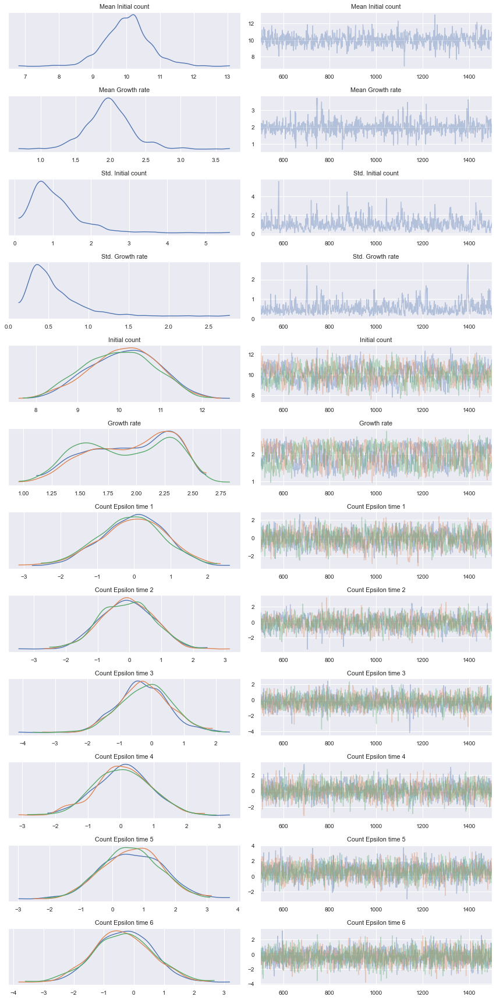

In [197]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1))      # Std. exponential growth
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1], n_samples=3)

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

In [198]:
import matplotlib.animation as animation
import numpy as np
from pylab import *

dpi = 100

# Get parameters
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
mean_y0 = posterior_samples_filter[
    'Mean Initial count'].sel(draw=slice(500, 1500)).values[0]
std_y0 = posterior_samples_filter[
    'Std. Initial count'].sel(draw=slice(500, 1500)).values[0]
mean_gr = posterior_samples_filter[
    'Mean Growth rate'].sel(draw=slice(500, 1500)).values[0]
std_gr = posterior_samples_filter[
    'Std. Growth rate'].sel(draw=slice(500, 1500)).values[0]

# Plot data-generating distribution as reference to parameter space
n_samples = 1000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
def ani_frame():
    # Set up figure
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))

    samples = population_model.sample(
        [mean_y0[0], mean_gr[0], std_y0[0], std_gr[0]], n_samples)
    sns.kdeplot(
        x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
        color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
        linestyles='solid', ax=ax)

    # Illustrate samples corresponding to the measurements
    for idm in range(3):
        ax.scatter(
            y0[0, idm], gr[0, idm], marker='o')

    # Legend, ranges axes labels
    fontsize = 16
    ax.set_xlim([7, 13])
    ax.set_ylim([0.5, 3.5])
    ax.set_xlabel('Initial count', fontsize=fontsize)
    ax.set_ylabel('Growth rate', fontsize=fontsize)
    ax.tick_params(labelsize=fontsize)

    tight_layout()

    def update_img(n):
        plt.cla()
        samples = population_model.sample(
            [mean_y0[n], mean_gr[n], std_y0[n], std_gr[n]], n_samples)
        sns.kdeplot(
            x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5,
            color=sns.color_palette()[0], levels=[0.2, 0.4, 0.6, 0.8, 1],
            linestyles='solid', ax=ax)

        # Illustrate samples corresponding to the measurements
        for idm in range(3):
            ax.scatter(
                y0[n, idm], gr[n, idm], marker='o')

        # Legend, ranges axes labels
        fontsize = 16
        ax.set_xlim([7, 13])
        ax.set_ylim([0.5, 3.5])
        ax.set_xlabel('Initial count', fontsize=fontsize)
        ax.set_ylabel('Growth rate', fontsize=fontsize)
        ax.tick_params(labelsize=fontsize)

        tight_layout()

        return fig

    #legend(loc=0)
    ani = animation.FuncAnimation(fig, update_img, 100, interval=100)

    ani.save('pfi_pop_fit_3_samples.gif', dpi=dpi)
    return ani

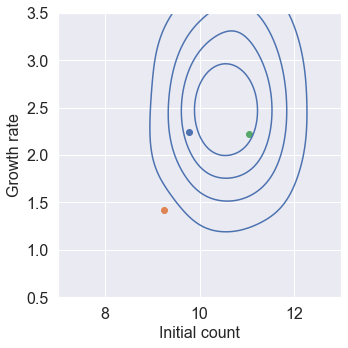

In [199]:
ani_frame()

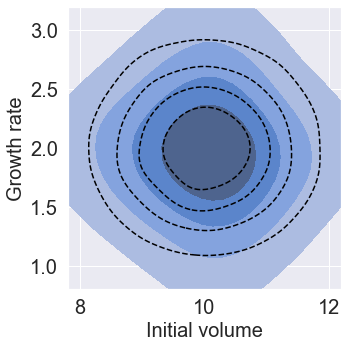

In [200]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Plot population filter inference results (parameter space)
seed = np.random.default_rng(3)
n_samples = 50000
parameters =  posterior_samples_filter.sel(
    draw=slice(warmup, n_iterations))
parameters = np.vstack([
    parameters['Mean Initial count'].values.flatten(),
    parameters['Mean Growth rate'].values.flatten(),
    parameters['Std. Initial count'].values.flatten(),
    parameters['Std. Growth rate'].values.flatten()]).T
parameters = parameters[
    np.random.choice(np.arange(len(parameters)), size=n_samples, replace=True)]
samples = np.empty(shape=(n_samples, 2))
population_model = chi.GaussianModel(
        n_dim=2, dim_names=['Initial count', 'Growth rate'], centered=True)
for ids, params in enumerate(parameters):
    samples[ids, :] = population_model.sample(params, seed=seed)[0]
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes)

# Plot data-generating distribution as reference to parameter space
samples = population_model.sample(population_parameters[:-1], n_samples, seed)
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes)

# Legend, ranges axes labels
fontsize = 20
axes.plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes.plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes.set_xlim([7.8, 12.2])
axes.set_ylim([0.8, 3.2])
axes.set_xlabel('Initial volume', fontsize=fontsize)
axes.set_ylabel('Growth rate', fontsize=fontsize)
axes.tick_params(labelsize=fontsize)

plt.savefig(
    'pfi_3_samples.pdf',
    bbox_inches='tight')
plt.tight_layout()

Bimodal

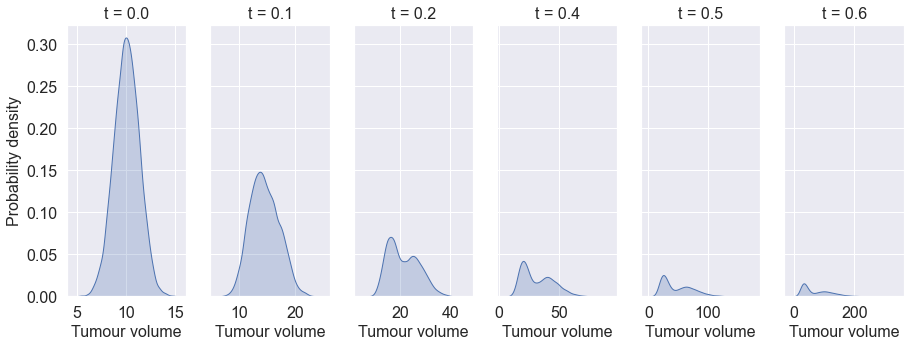

In [233]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements_1 = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Second mode
population_parameters_2 = np.copy(population_parameters)
population_parameters_2[1] = 4
seed = 3
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements_2 = predictive_model.sample(
    population_parameters_2, times, n_samples=n_ids, seed=seed, return_df=False)
measurements = np.empty(shape=(1, 6, 2*n_ids))
measurements[:, :, :n_ids] = dense_measurements_1
measurements[:, :, n_ids:] = dense_measurements_2

fontsize = '16'
fig, axes = plt.subplots(
    1, len(times), figsize=(15, 5), sharey='row')
axes[0].set_ylabel('Probability density', fontsize=fontsize)
for tid, time in enumerate(times):
    # Add title and x-label to subfigure
    axes[tid].set_title('t = %.1f' % time, fontsize=fontsize)
    axes[tid].set_xlabel('Tumour volume', fontsize=fontsize)
    axes[tid].tick_params(labelsize=fontsize)

    # Plot KDE plot
    sns.kdeplot(
        x=measurements[0, tid], fill=True, linewidth=1, ax=axes[tid],
        legend=False, color=sns.color_palette()[0])

plt.savefig(
    'bimodal_exponential_growth_time_slice.pdf',
    bbox_inches='tight')

plt.show()

In [240]:
# Define data-generating model
mechanistic_model = ToyExponentialGrowthModel()
error_model = chi.GaussianErrorModel()
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(n_dim=2, dim_names=['Initial count', 'Growth rate']),
    chi.PooledModel(dim_names=['Sigma'])])
predictive_model = chi.PredictiveModel(mechanistic_model, error_model)
predictive_model = chi.PopulationPredictiveModel(
    predictive_model, population_model)

# Simulate measurements
seed = 2
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements_1 = predictive_model.sample(
    population_parameters, times, n_samples=n_ids, seed=seed, return_df=False)

# Second mode
population_parameters_2 = np.copy(population_parameters)
population_parameters_2[1] = 4
seed = 3
n_ids = 5000
times = np.linspace(0, 0.6, num=6)
dense_measurements_2 = predictive_model.sample(
    population_parameters_2, times, n_samples=n_ids, seed=seed, return_df=False)

# Keep only one measurement per individual (100 measurements per time point)
n_ids = 100
n_times = len(times)
n_observables = 1
measurements = np.empty(shape=(2*n_ids, n_observables, n_times))
for idt in range(n_times):
    start_ids = idt * n_ids
    end_ids = (idt + 1) * n_ids
    measurements[:n_ids, 0, idt] = dense_measurements_1[0, idt, start_ids:end_ids]
    measurements[n_ids:, 0, idt] = dense_measurements_2[0, idt, start_ids:end_ids]

# Visualise measurements
fig = go.Figure()
for idt in range(n_times):
    for idx in range(2*n_ids):
        fig.add_trace(go.Scatter(
            x=[times[idt]],
            y=[measurements[idx, 0, idt]],
            mode='markers+lines',
            name='ID %d' % (idt + (n_times * idx))
        ))
fig.update_layout(
    template='plotly_white',
    xaxis_title='Time',
    yaxis_title='Measurement'
)
fig.show()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     515    0.5      256      0:00.9
1     546    0.497    16       0:00.9
2     561    0.313    8        0:00.9
3     592    0.339    16       0:01.0
20    1980   0.722    78       0:03.9
40    3930   0.783952 93       0:07.6
60    6138   0.762206 106      0:12.0
80    7498   0.747    65       0:14.5
100   9022   0.76     73       0:17.1
120   10027  0.707    48       0:18.8
140   10860  0.77     40       0:20.4
160   11775  0.711    44       0:22.6
180   12345  0.752    28       0:23.4
200   13066  0.758    35       0:24.5
220   13734  0.763    32       0:25.8
240   14370  0.754    31       0:26.8
260   15028  0.707    32       0:28.2
280   15932  0.756    44       0:30.1
300   16592  0.755    32       0:31.1
320   17276  0.751    33       0:32.5
340   17929  0.742    32       0:33.7
360   18709  0.761    38       0:35.2
380   19340  0.77     31       0:36.2
400   19944  0.769

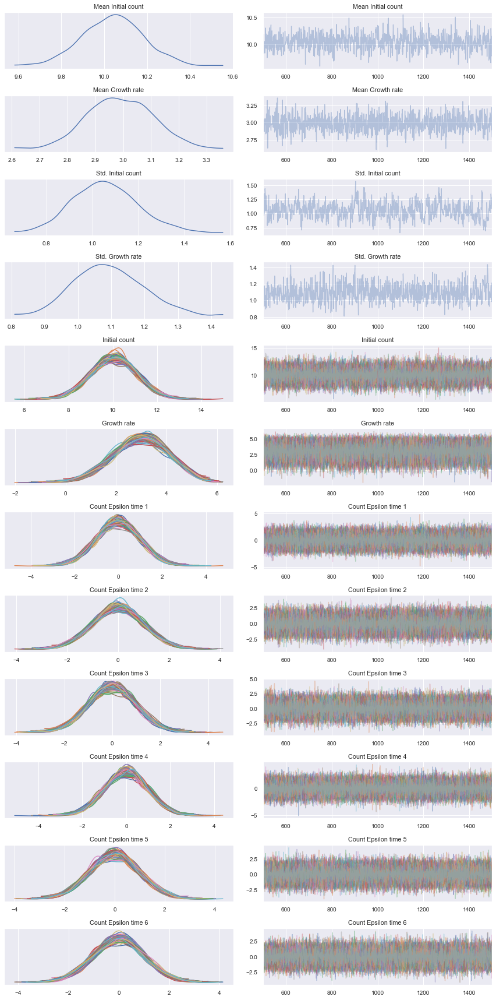

In [223]:
# Define population filter log-posterior
population_filter = chi.GaussianFilter(measurements)
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1))      # Std. exponential growth
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1])

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

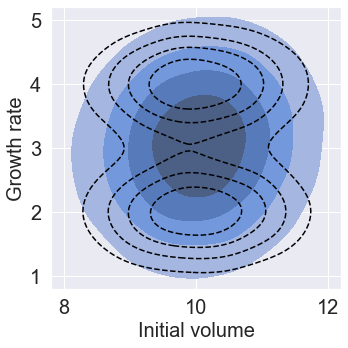

In [227]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Plot population filter inference results (parameter space)
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
sns.kdeplot(
    x=y0.flatten(), y=gr.flatten(), fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes)

# Plot data-generating distribution as reference to parameter space
n_samples = 25000
samples_1 = population_model.sample(population_parameters[:-1], n_samples)
samples_2 = population_model.sample(population_parameters_2[:-1], n_samples)
samples = np.vstack([samples_1, samples_2])
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes)

# Legend, ranges axes labels
fontsize = 20
axes.plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes.plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes.set_xlim([7.8, 12.2])
axes.set_ylim([0.8, 5.2])
axes.set_xlabel('Initial volume', fontsize=fontsize)
axes.set_ylabel('Growth rate', fontsize=fontsize)
axes.tick_params(labelsize=fontsize)

plt.savefig(
    'pfi_bimodal_gaussian_filter.pdf',
    bbox_inches='tight')
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     515    0.5      256      0:03.4
1     546    0.488103 16       0:03.6
2     557    0.0476   6        0:03.7
3     684    0.499    64       0:04.4
20    2920   0.733    125      0:18.4
40    4924   0.788    96       0:29.0
60    6596   0.761    80       0:37.3
80    8372   0.758    85       0:46.0
100   10175  0.738    86       0:54.6
120   11599  0.735    68       1:01.6
140   12587  0.748    48       1:06.6
160   13425  0.747    40       1:11.1
180   14925  0.752    72       1:18.6
200   15801  0.758    42       1:22.9
220   17029  0.755649 59       1:28.8
240   18081  0.745    51       1:34.0
260   19076  0.712    48       1:38.9
280   20272  0.738    57       1:44.7
300   21388  0.775    54       1:50.1
320   22360  0.767    47       1:54.9
340   23188  0.751    40       1:59.0
360   23968  0.752    38       2:03.0
380   24684  0.751    35       2:06.3
400   25304  0.745

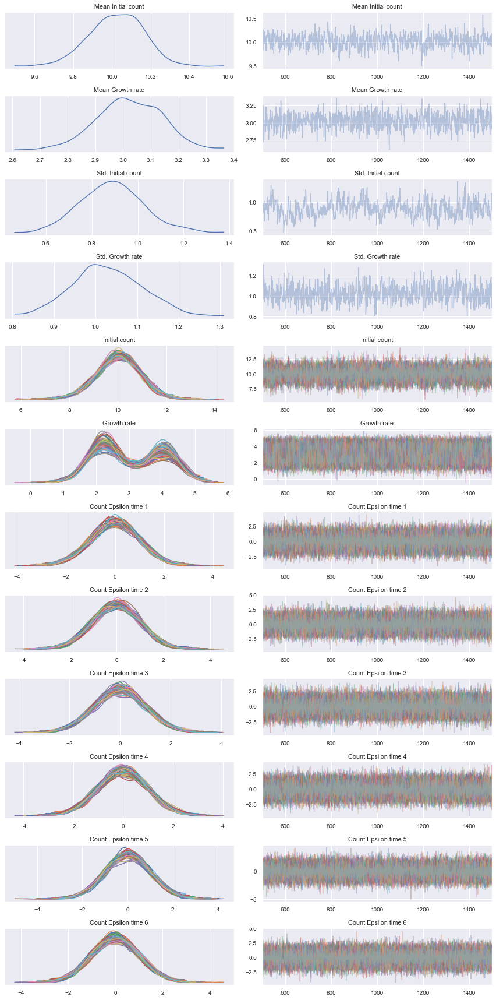

In [228]:
# Define population filter log-posterior
population_filter = chi.GaussianKDEFilter(measurements)
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(
    pints.GaussianLogPrior(9, 3),        # Mean initial condition
    pints.GaussianLogPrior(5, 3),        # Mean exponential growth
    pints.LogNormalLogPrior(-0.1, 1),    # Std. initial condition
    pints.LogNormalLogPrior(-1, 1))      # Std. exponential growth
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1])

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

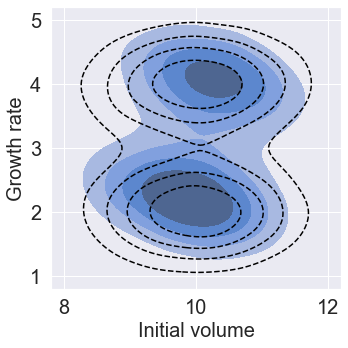

In [229]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Plot population filter inference results (parameter space)
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = posterior_samples_filter[
    'Growth rate'].sel(draw=slice(500, 1500)).values[0]
sns.kdeplot(
    x=y0.flatten(), y=gr.flatten(), fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes)

# Plot data-generating distribution as reference to parameter space
n_samples = 25000
samples_1 = population_model.sample(population_parameters[:-1], n_samples)
samples_2 = population_model.sample(population_parameters_2[:-1], n_samples)
samples = np.vstack([samples_1, samples_2])
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes)

# Legend, ranges axes labels
fontsize = 20
axes.plot(
    [100, 101], [100, 101], color='black', linestyle='--', label='True')
axes.plot(
    [100, 101], [100, 101], color=plt.get_cmap('Blues_r')(0),label='Inferred')
axes.set_xlim([7.8, 12.2])
axes.set_ylim([0.8, 5.2])
axes.set_xlabel('Initial volume', fontsize=fontsize)
axes.set_ylabel('Growth rate', fontsize=fontsize)
axes.tick_params(labelsize=fontsize)

plt.savefig(
    'pfi_bimodal_gaussian_kde_filter.pdf',
    bbox_inches='tight')
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     10     0.1      2        0:00.1
1     11     0.25     1        0:00.1
2     14     0.125    2        0:00.1
3     45     0.5      16       0:00.4
20    1180   0.753    64       0:07.5
40    2520   0.75     64       0:15.1
60    3380   0.7545   41       0:20.2
80    4512   0.751917 54       0:26.7
100   5424   0.765    44       0:31.9
120   7120   0.721    81       0:41.8
140   8508   0.768    67       0:49.5
160   9689   0.71     57       0:56.1
180   11269  0.763033 76       1:05.2
200   12465  0.725    57       1:11.9
220   13821  0.789    65       1:19.4
240   15049  0.744    59       1:26.3
260   16142  0.724    52       1:32.4
280   17594  0.756    70       1:40.6
300   18646  0.734    51       1:47.0
320   19682  0.781    50       1:52.8
340   20654  0.761515 47       1:58.3
360   21690  0.74247  50       2:04.2
380   22758  0.779    51       2:10.2
400   23602  0.751

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/arviz/plots/traceplot.py:212: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (206), generating only 20 plots



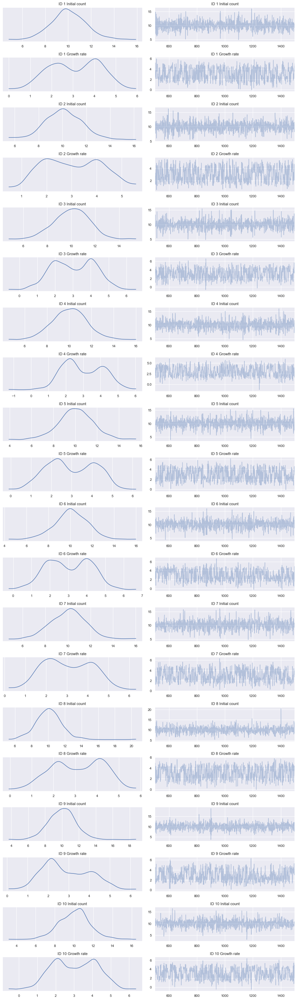

In [249]:
# Define population filter log-posterior
n_samples = 100
population_filter = chi.GaussianKDEFilter(measurements)
population_model = chi.HeterogeneousModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(10, 3),        # initial condition
    pints.GaussianLogPrior(3, 2)          # exponential growth
] * n_samples)
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1], n_samples=n_samples)

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

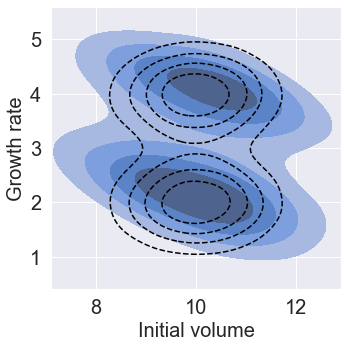

In [252]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Plot population filter inference results (parameter space)
y0 = []
gr = []
for idx in np.arange(1, 101):
    y0.append(posterior_samples_filter[
        'ID %d Initial count' % idx].sel(draw=slice(500, 1500)).values[0])
    gr.append(posterior_samples_filter[
        'ID %d Growth rate' % idx].sel(draw=slice(500, 1500)).values[0])
sns.kdeplot(
    x=np.array(y0).flatten(), y=np.array(gr).flatten(), fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes)

# Plot data-generating distribution as reference to parameter space
n_samples = 25000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
samples_1 = population_model.sample(population_parameters[:-1], n_samples)
samples_2 = population_model.sample(population_parameters_2[:-1], n_samples)
samples = np.vstack([samples_1, samples_2])
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes)

# Legend, ranges axes labels
fontsize = 20
axes.set_xlim([7.1, 12.9])
axes.set_ylim([0.4, 5.6])
axes.set_xlabel('Initial volume', fontsize=fontsize)
axes.set_ylabel('Growth rate', fontsize=fontsize)
axes.tick_params(labelsize=fontsize)

plt.savefig(
    'pfi_bimodal_gaussian_kde_filter_heterogeneous_model.pdf',
    bbox_inches='tight')
plt.tight_layout()

Using No-U-Turn MCMC
Generating 1 chains.
Running in sequential mode.
Iter. Eval. Accept.   Steps. Time m:s
0     8      0.125    2        0:00.1
1     9      0.25     1        0:00.1
2     13     0.1      2        0:00.1
3     76     0.5      32       0:00.5
20    1408   0.768    74       0:09.3
40    3279   0.725    90       0:22.4
60    5046   0.769    85       0:33.3
80    6786   0.741    83       0:43.1
100   8349   0.748    75       0:53.8
120   9550   0.704    58       1:01.8
140   10746  0.761    57       1:09.4
160   12221  0.724    71       1:17.6
180   13577  0.753874 65       1:25.2
200   14517  0.74     45       1:30.6
220   15649  0.786    54       1:36.9
240   16429  0.726    38       1:41.2
260   17504  0.74     52       1:47.2
280   18748  0.729    60       1:54.0
300   20120  0.77868  66       2:02.5
320   20964  0.747    41       2:07.3
340   21936  0.775    47       2:12.7
360   22844  0.751    44       2:17.9
380   23592  0.751    36       2:22.1
400   24276  0.731

/Users/david/Workspace/sabs-r3/population-kde-inference/venv/lib/python3.9/site-packages/arviz/plots/traceplot.py:212: UserWarning:

rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (109), generating only 20 plots



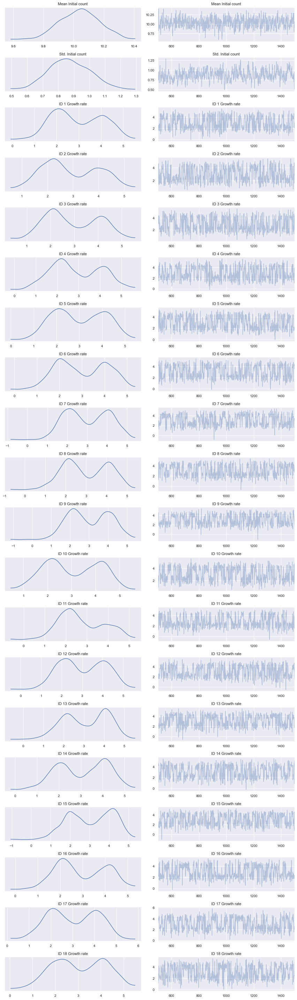

In [253]:
# Define population filter log-posterior
n_samples = 100
population_filter = chi.GaussianKDEFilter(measurements)
population_model = chi.ComposedPopulationModel([
    chi.GaussianModel(
        n_dim=1, dim_names=['Initial count']),
    chi.HeterogeneousModel(
        n_dim=1, dim_names=['Growth rate'])])
log_prior = pints.ComposedLogPrior(*[
    pints.GaussianLogPrior(9, 3),          # Mean initial condition
    pints.LogNormalLogPrior(-0.1, 1)] +    # Std. initial condition
    [pints.GaussianLogPrior(3, 2)          # exponential growth
] * n_samples)
log_posterior = chi.PopulationFilterLogPosterior(
    population_filter, times, mechanistic_model, population_model, log_prior,
    sigma=population_parameters[-1], n_samples=n_samples)

# Run inference
seed = 2
controller = chi.SamplingController(log_posterior, seed=seed)
controller.set_n_runs(1)
controller.set_parallel_evaluation(False)
controller.set_sampler(pints.NoUTurnMCMC)
n_iterations = 1500
posterior_samples_filter = controller.run(
    n_iterations=n_iterations, log_to_screen=True)

warmup = 500
thinning = 1
az.plot_trace(
    posterior_samples_filter.sel(draw=slice(warmup, n_iterations, thinning)))
plt.tight_layout()

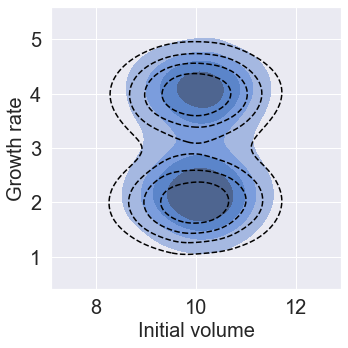

In [254]:
# Set up figure
fig, axes = plt.subplots(
    nrows=1, ncols=1, figsize=(5, 5))

# Plot population filter inference results (parameter space)
y0 = posterior_samples_filter[
    'Initial count'].sel(draw=slice(500, 1500)).values[0]
gr = []
for idx in np.arange(1, 101):
    gr.append(posterior_samples_filter[
        'ID %d Growth rate' % idx].sel(draw=slice(500, 1500)).values[0])
sns.kdeplot(
    x=np.array(y0).flatten(), y=np.array(gr).flatten(), fill=True, bw_adjust=1.5,
    levels=[0.2, 0.4, 0.6, 0.8, 1], ax=axes)

# Plot data-generating distribution as reference to parameter space
n_samples = 25000
population_model = chi.GaussianModel(
    n_dim=2, dim_names=['Initial count', 'Growth rate'])
samples_1 = population_model.sample(population_parameters[:-1], n_samples)
samples_2 = population_model.sample(population_parameters_2[:-1], n_samples)
samples = np.vstack([samples_1, samples_2])
sns.kdeplot(
    x=samples[:, 0], y=samples[:, 1], fill=False, bw_adjust=1.5, color='black',
    levels=[0.2, 0.4, 0.6, 0.8, 1], linestyles='dashed', ax=axes)

# Legend, ranges axes labels
fontsize = 20
axes.set_xlim([7.1, 12.9])
axes.set_ylim([0.4, 5.6])
axes.set_xlabel('Initial volume', fontsize=fontsize)
axes.set_ylabel('Growth rate', fontsize=fontsize)
axes.tick_params(labelsize=fontsize)

plt.savefig(
    'pfi_bimodal_gaussian_kde_filter_gaussian_and_heterogeneous_model.pdf',
    bbox_inches='tight')
plt.tight_layout()